In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy
import scipy
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import math
import MDAnalysis

So, I can load many of the standard Python libraries above, but there will almost certainly be some dependency problems to resolve on hpslu with respect to my spherical Voronoi code.

In [3]:
import sys; sys.path.append('/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi')
import voronoi_utility
sys.path.append('/sansom/sc2/bioc1009/python_scripts/matplotlib_scripts')
import multicore_vesicle_virion_analysis

By installing the Anaconda Python distribution in a local directory on hpslu I seem to have resolved the library issues.

In [4]:
#start drafting IPython parallel workflow setup
from IPython.parallel import Client
rc = Client()

In [5]:
#make sure the engines are connected to the controller:
rc.ids

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

In [6]:
#so, have 10 cores available for work
#make sure each engine (each core) has the appropriate imports & magics for its namespace
dview = rc[:] #direct view to all engines
with dview.sync_imports(): #with PYTHONPATH appropriately adjusted BEFORE starting ipcluster
    import numpy
    import scipy
    import math
    import MDAnalysis 
    import voronoi_utility
    import multicore_vesicle_virion_analysis
    import voronoi_analysis_library

importing numpy on engine(s)
importing scipy on engine(s)
importing math on engine(s)
importing MDAnalysis on engine(s)
importing voronoi_utility on engine(s)
importing multicore_vesicle_virion_analysis on engine(s)
importing voronoi_analysis_library on engine(s)


In [7]:
%px %load_ext autoreload
%px %autoreload 2

In [8]:
#assign appropriate remote engine(s) as needed:
engine_sim33 = rc[0]
engine_sim35 = rc[1]
engine_sim36 = rc[2]
engine_sim37 = rc[3]

In [9]:
#it will likely take quite a while to load the sim33 Universe object because of the files still on hfs0:
#try to load the sim33 universe object asynchronously on a remote engine (likewise for sim35--and eventually other replicates)
engine_sim33.execute("reload(voronoi_analysis_library)")
engine_sim35.execute("reload(voronoi_analysis_library)")
ar_sim33 = engine_sim33.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/',data_path_2='/sansom/n04/bioc1009/July2_2012_equil_vesicle_NO_Forss/',limit_1=99,limit_2=101,limit_3=-30,limit_4 =-28, coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/vesicle_build_adjusted_June19_2012/compact_neutral_antifreeze_nosolvent.gro', traj_data_extension='yes')")
ar_sim35 = engine_sim35.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Aug_20_2012_non_Forss_virion_prod_5us_rad_080_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")


In [10]:
#try loading more replicates in parallel now (should be able to handle those that do not include FORS glycolipid):
engine_sim36.execute("reload(voronoi_analysis_library)")
engine_sim37.execute("reload(voronoi_analysis_library)")
ar_sim36 = engine_sim36.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Aug_21_2012_non_Forss_virion_prod_5us_rad_080_PULL_CODE/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/Aug_21_2012_non_Forss_virion_prod_5us_rad_080_PULL_CODE/',limit_3=-6,limit_4=-4)")
ar_sim37 = engine_sim37.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Nov_26_2012_non_Forss_virion_prod_5us_rad_080_unrestrained_323K/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")



In [11]:
#assign remote engines for sims38/39:
engine_sim38 = rc[4]
engine_sim39 = rc[5]

In [12]:
#load the universe objects into memory for sims38/39 on their respective engines:
engine_sim38.execute("reload(voronoi_analysis_library)")
engine_sim39.execute("reload(voronoi_analysis_library)")
ar_sim38 = engine_sim38.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Jan_11_2013_sim38_FORS_inclusive_295K_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/Forss_virion_by_conversion_Sept_2012/md_Lizzie_PR3_compact.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/Jan_11_2013_sim38_FORS_inclusive_295K_unrestrained/',limit_3=-6,limit_4=-4)")
ar_sim39 = engine_sim39.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/March_16_2013_sim39_FORS_inclusive_323K_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/Forss_virion_by_conversion_Sept_2012/md_Lizzie_PR3_compact.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/March_16_2013_sim39_FORS_inclusive_323K_unrestrained/',limit_3=-6,limit_4=-4)")

In [13]:
#assign a remote engine for dengue (sim126 extended)
engine_dengue = rc[6]

In [14]:
#load the skip-10 processed dengue trajectory (5-10 microseconds at 323 K; verify ~5000 frames after loading) on the remote IPython engine
engine_dengue.execute("reload(voronoi_analysis_library)")
ar_dengue = engine_dengue.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine_dengue('/sansom/n22/bioc1009/sim126_extended/sim126_insect_dengue_323K_extended.part0026.gro')") #the sim126 extended trajectory file list is generated inside the function

In [24]:
ar_sim33.ready()

True

In [25]:
ar_sim33.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [23]:
ar_dengue.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [16]:
#start testing production and loading of control xtc files:
engine_control_1 = rc[7]
engine_control_2 = rc[8]

In [61]:
#use one of the control engines to generate (write to disk) both control xtc files:
engine_control_1.execute("reload(voronoi_analysis_library)")
ar_generate_controls = engine_control_1.execute("voronoi_analysis_library.create_control_universe_data('/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")

In [256]:
#likewise, use one of the control engines to generate (write to disk) both control .gro files:
engine_control_1.execute("reload(voronoi_analysis_library)")
ar_generate_control_coords = engine_control_1.execute("voronoi_analysis_library.create_control_universe_coord_data('/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")

In [259]:
ar_generate_control_coords.ready()

True

In [260]:
ar_generate_control_coords.get()


In [245]:
ar_generate_controls.ready()

True

In [246]:
ar_generate_controls.get()

In [17]:
#load the first control trajectory into a universe object on a remote IPython engine
ar_load_control_1 = engine_control_1.execute("universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_1.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_1.xtc')")

In [18]:
#and now load the second control trajectory into a universe object on a remote IPython engine
ar_load_control_2 = engine_control_2.execute("universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.xtc')")

In [20]:
ar_load_control_2.ready()

True

In [21]:
ar_load_control_2.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [166]:
#check to see if universe objects have been loaded asychronously on their respective IPython engines (cores):
[ar.ready() for ar in [ar_sim33,ar_sim35,ar_sim36,ar_sim37,ar_sim38,ar_sim39,ar_dengue]]

[True, True, True, True, True, True, True]

In [19]:
ar_dengue.get()

In [27]:
ar_dengue_frame_count = engine_dengue.execute("numframes = universe_object.trajectory.numframes")

In [32]:
ar_dengue_frame_count.ready()

True

In [33]:
engine_dengue['numframes'] #~5000 is very reasonable for the skip-10 processed trajectory

5001

In [36]:
(ar_sim38.ready(),ar_sim39.ready(),ar_sim33.ready(),ar_sim35.ready(),ar_sim36.ready(),ar_sim37.ready(),ar_dengue.ready(),ar_load_control_1.ready(),ar_load_control_2.ready())


(True, True, True, True, True, True, True, True, True)

In [34]:
(ar_sim36.ready(),ar_sim37.ready())


(True, True)

In [546]:
ar_sim38.get()

In [472]:
#check that the number of frames loaded for sims36 & 37 is reasonable
ar3 = engine_sim36.execute('numframes = universe_object.trajectory.numframes')
ar4 = engine_sim37.execute('numframes = universe_object.trajectory.numframes')

In [547]:
#check that the number of frames loaded for sims38 & 39 is reasonable
ar3 = engine_sim38.execute('numframes = universe_object.trajectory.numframes')
ar4 = engine_sim39.execute('numframes = universe_object.trajectory.numframes')


In [548]:
(ar3.ready(),ar4.ready())

(True, True)

In [549]:
(ar3.get(),ar4.get())

(, )

In [476]:
engine_sim36['numframes'],engine_sim37['numframes']

(40381, 49089)

In [557]:
engine_sim38['numframes'],engine_sim39['numframes']


(49505, 50013)

Those are reasonable frame numbers for sims36/37, so they may be correctly loaded on 2 more engines (cores).

In [364]:
#check the results of loading sim33/35/etc. universe objects on their respective engines (won't be able to access universe object directly because it can't be pickled):
ar1 = engine_sim35.execute('numframes = universe_object.trajectory.numframes')
ar2 = engine_sim33.execute('numframes = universe_object.trajectory.numframes')

In [362]:
(ar_sim33.ready(), ar_sim35.ready())

(True, True)

In [363]:
(ar_sim33.get(),ar_sim35.get())


(, )

In [365]:
(ar1.ready(),ar2.ready())

(True, True)

In [366]:
(engine_sim33['numframes'],engine_sim35['numframes'])

(48956, 49446)

So, finally have confirmation of reasonable frame numbers for sim33/35 universe objects loading in parallel on two different IPython engines (cores). Will eventually want to expand this workflow to include more replicates.

In [37]:
#test newly-abstracted precursor code for radial distance assessment on sims33/35 in parallel initially
engine_sim33.execute("reload(voronoi_analysis_library)")
engine_sim35.execute("reload(voronoi_analysis_library)")
precursor_ar_sim33 = engine_sim33.execute("list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim35 = engine_sim35.execute("sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")

In [38]:
#perform precursor radial distance analysis for first control universe
engine_control_1.execute("reload(voronoi_analysis_library)")
precursor_ar_control_1 = engine_control_1.execute("control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None,control_condition=1)")


In [39]:
#perform precursor radial distance analysis for second control universe
engine_control_2.execute("reload(voronoi_analysis_library)")
precursor_ar_control_2 = engine_control_2.execute("control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None,control_condition=1)")


In [40]:
#now expand the testing of abstracted precursor code to include the remaing flu simulations (sims 36,37,38,39)
engine_sim36.execute("reload(voronoi_analysis_library)")
engine_sim37.execute("reload(voronoi_analysis_library)")
engine_sim38.execute("reload(voronoi_analysis_library)")
engine_sim39.execute("reload(voronoi_analysis_library)")
precursor_ar_sim36 = engine_sim36.execute("sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim37 = engine_sim37.execute("sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim38 = engine_sim38.execute("sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_frame_numbers,sim38_list_FORS_percent_above_treshold,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=1)")
precursor_ar_sim39 = engine_sim39.execute("sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_frame_numbers,sim39_list_FORS_percent_above_treshold,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=1)")

In [41]:
#start testing precursor radial distance assessment code for dengue simulation:
engine_dengue.execute("reload(voronoi_analysis_library)")
precursor_ar_dengue = engine_dengue.execute("list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances = voronoi_analysis_library.precursor_radial_distance_analysis_dengue(universe_object)")

In [792]:
precursor_ar_dengue.ready()

True

In [793]:
precursor_ar_dengue.get()

In [759]:
!pwd

/sansom/n22/bioc1009/spherical_Voronoi_virus_work


In [46]:
(precursor_ar_control_1.ready(),precursor_ar_sim33.ready(),precursor_ar_sim35.ready(),precursor_ar_sim36.ready(),precursor_ar_sim37.ready(),precursor_ar_sim38.ready(),precursor_ar_sim39.ready(),precursor_ar_dengue.ready(),precursor_ar_control_2.ready())

(True, True, True, True, True, True, True, True, True)

In [328]:
precursor_ar_control_2.get()

In [48]:
#now pull the precursor radial distance assessment data back from the engines so I can plot locally below
list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold = [engine_sim33[key] for key in ['list_min_PPCH_PO4_distances','list_max_PPCH_PO4_distances','list_average_PPCH_PO4_distances','list_std_dev_PPCH_PO4_distances','list_frame_numbers','list_PPCH_percent_above_treshold','list_min_CHOL_ROH_distances','list_max_CHOL_ROH_distances','list_average_CHOL_ROH_distances','list_std_dev_CHOL_ROH_distances','list_CHOL_ROH_midpoint_distances','list_CHOL_ROH_percent_above_threshold','list_CHOL_ROH_percent_below_threshold','list_min_remaining_headgroup_distances','list_max_remaining_headgroup_distances','list_average_remaining_headgroup_distances','list_std_dev_remaining_headgroup_distances','list_remaining_headgroup_midpoint_distances','list_remaining_headgroup_percent_above_threshold','list_remaining_headgroup_percent_below_threshold','threshold']]
sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold = [engine_sim35[key] for key in ['sim35_list_min_PPCH_PO4_distances','sim35_list_max_PPCH_PO4_distances','sim35_list_average_PPCH_PO4_distances','sim35_list_std_dev_PPCH_PO4_distances','sim35_list_frame_numbers','sim35_list_PPCH_percent_above_treshold','sim35_list_min_CHOL_ROH_distances','sim35_list_max_CHOL_ROH_distances','sim35_list_average_CHOL_ROH_distances','sim35_list_std_dev_CHOL_ROH_distances','sim35_list_CHOL_ROH_midpoint_distances','sim35_list_CHOL_ROH_percent_above_threshold','sim35_list_CHOL_ROH_percent_below_threshold','sim35_list_min_remaining_headgroup_distances','sim35_list_max_remaining_headgroup_distances','sim35_list_average_remaining_headgroup_distances','sim35_list_std_dev_remaining_headgroup_distances','sim35_list_remaining_headgroup_midpoint_distances','sim35_list_remaining_headgroup_percent_above_threshold','sim35_list_remaining_headgroup_percent_below_threshold','sim35_threshold']]
sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold = [engine_sim36[key] for key in ['sim36_list_min_PPCH_PO4_distances','sim36_list_max_PPCH_PO4_distances','sim36_list_average_PPCH_PO4_distances','sim36_list_std_dev_PPCH_PO4_distances','sim36_list_frame_numbers','sim36_list_PPCH_percent_above_treshold','sim36_list_min_CHOL_ROH_distances','sim36_list_max_CHOL_ROH_distances','sim36_list_average_CHOL_ROH_distances','sim36_list_std_dev_CHOL_ROH_distances','sim36_list_CHOL_ROH_midpoint_distances','sim36_list_CHOL_ROH_percent_above_threshold','sim36_list_CHOL_ROH_percent_below_threshold','sim36_list_min_remaining_headgroup_distances','sim36_list_max_remaining_headgroup_distances','sim36_list_average_remaining_headgroup_distances','sim36_list_std_dev_remaining_headgroup_distances','sim36_list_remaining_headgroup_midpoint_distances','sim36_list_remaining_headgroup_percent_above_threshold','sim36_list_remaining_headgroup_percent_below_threshold','sim36_threshold']]
sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold = [engine_sim37[key] for key in ['sim37_list_min_PPCH_PO4_distances','sim37_list_max_PPCH_PO4_distances','sim37_list_average_PPCH_PO4_distances','sim37_list_std_dev_PPCH_PO4_distances','sim37_list_frame_numbers','sim37_list_PPCH_percent_above_treshold','sim37_list_min_CHOL_ROH_distances','sim37_list_max_CHOL_ROH_distances','sim37_list_average_CHOL_ROH_distances','sim37_list_std_dev_CHOL_ROH_distances','sim37_list_CHOL_ROH_midpoint_distances','sim37_list_CHOL_ROH_percent_above_threshold','sim37_list_CHOL_ROH_percent_below_threshold','sim37_list_min_remaining_headgroup_distances','sim37_list_max_remaining_headgroup_distances','sim37_list_average_remaining_headgroup_distances','sim37_list_std_dev_remaining_headgroup_distances','sim37_list_remaining_headgroup_midpoint_distances','sim37_list_remaining_headgroup_percent_above_threshold','sim37_list_remaining_headgroup_percent_below_threshold','sim37_threshold']]
sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_frame_numbers,sim38_list_FORS_percent_above_treshold,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold = [engine_sim38[key] for key in ['sim38_list_min_FORS_AM2_distances','sim38_list_max_FORS_AM2_distances','sim38_list_average_FORS_AM2_distances','sim38_list_std_dev_FORS_AM2_distances','sim38_list_frame_numbers','sim38_list_FORS_percent_above_treshold','sim38_list_min_PPCH_PO4_distances','sim38_list_max_PPCH_PO4_distances','sim38_list_average_PPCH_PO4_distances','sim38_list_std_dev_PPCH_PO4_distances','sim38_list_PPCH_percent_above_treshold','sim38_list_min_CHOL_ROH_distances','sim38_list_max_CHOL_ROH_distances','sim38_list_average_CHOL_ROH_distances','sim38_list_std_dev_CHOL_ROH_distances','sim38_list_CHOL_ROH_midpoint_distances','sim38_list_CHOL_ROH_percent_above_threshold','sim38_list_CHOL_ROH_percent_below_threshold','sim38_list_min_remaining_headgroup_distances','sim38_list_max_remaining_headgroup_distances','sim38_list_average_remaining_headgroup_distances','sim38_list_std_dev_remaining_headgroup_distances','sim38_list_remaining_headgroup_midpoint_distances','sim38_list_remaining_headgroup_percent_above_threshold','sim38_list_remaining_headgroup_percent_below_threshold','sim38_threshold']]
sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_frame_numbers,sim39_list_FORS_percent_above_treshold,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold = [engine_sim39[key] for key in ['sim39_list_min_FORS_AM2_distances','sim39_list_max_FORS_AM2_distances','sim39_list_average_FORS_AM2_distances','sim39_list_std_dev_FORS_AM2_distances','sim39_list_frame_numbers','sim39_list_FORS_percent_above_treshold','sim39_list_min_PPCH_PO4_distances','sim39_list_max_PPCH_PO4_distances','sim39_list_average_PPCH_PO4_distances','sim39_list_std_dev_PPCH_PO4_distances','sim39_list_PPCH_percent_above_treshold','sim39_list_min_CHOL_ROH_distances','sim39_list_max_CHOL_ROH_distances','sim39_list_average_CHOL_ROH_distances','sim39_list_std_dev_CHOL_ROH_distances','sim39_list_CHOL_ROH_midpoint_distances','sim39_list_CHOL_ROH_percent_above_threshold','sim39_list_CHOL_ROH_percent_below_threshold','sim39_list_min_remaining_headgroup_distances','sim39_list_max_remaining_headgroup_distances','sim39_list_average_remaining_headgroup_distances','sim39_list_std_dev_remaining_headgroup_distances','sim39_list_remaining_headgroup_midpoint_distances','sim39_list_remaining_headgroup_percent_above_threshold','sim39_list_remaining_headgroup_percent_below_threshold','sim39_threshold']]


In [49]:
#likewise, pull the precursor dengue radial distance assessment data back from the remote engine:
list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,dengue_list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances = [engine_dengue[key] for key in ['list_min_dengue_lipid_headgroup_distances','list_max_dengue_lipid_headgroup_distances','list_average_dengue_lipid_headgroup_distances','list_std_dev_dengue_lipid_headgroup_distances','list_frame_numbers','list_dengue_lipid_headgroup_percent_above_threshold','list_dengue_lipid_headgroup_percent_below_threshold','list_dengue_lipid_headgroup_midpoint_distances','list_min_protein_distances','list_max_protein_distances']]


In [50]:
#likewise, pull the precursor control #1 radial distance assessment data back from the remote engine:
control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold = [engine_control_1[key] for key in ['control_1_list_min_PPCH_PO4_distances','control_1_list_max_PPCH_PO4_distances','control_1_list_average_PPCH_PO4_distances','control_1_list_std_dev_PPCH_PO4_distances','control_1_list_frame_numbers','control_1_list_PPCH_percent_above_treshold','control_1_list_min_CHOL_ROH_distances','control_1_list_max_CHOL_ROH_distances','control_1_list_average_CHOL_ROH_distances','control_1_list_std_dev_CHOL_ROH_distances','control_1_list_CHOL_ROH_midpoint_distances','control_1_list_CHOL_ROH_percent_above_threshold','control_1_list_CHOL_ROH_percent_below_threshold','control_1_list_min_remaining_headgroup_distances','control_1_list_max_remaining_headgroup_distances','control_1_list_average_remaining_headgroup_distances','control_1_list_std_dev_remaining_headgroup_distances','control_1_list_remaining_headgroup_midpoint_distances','control_1_list_remaining_headgroup_percent_above_threshold','control_1_list_remaining_headgroup_percent_below_threshold','control_1_threshold']]


In [51]:
#likewise, pull the precursor control #2 radial distance assessment data back from the remote engine:
control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold = [engine_control_2[key] for key in ['control_2_list_min_PPCH_PO4_distances','control_2_list_max_PPCH_PO4_distances','control_2_list_average_PPCH_PO4_distances','control_2_list_std_dev_PPCH_PO4_distances','control_2_list_frame_numbers','control_2_list_PPCH_percent_above_treshold','control_2_list_min_CHOL_ROH_distances','control_2_list_max_CHOL_ROH_distances','control_2_list_average_CHOL_ROH_distances','control_2_list_std_dev_CHOL_ROH_distances','control_2_list_CHOL_ROH_midpoint_distances','control_2_list_CHOL_ROH_percent_above_threshold','control_2_list_CHOL_ROH_percent_below_threshold','control_2_list_min_remaining_headgroup_distances','control_2_list_max_remaining_headgroup_distances','control_2_list_average_remaining_headgroup_distances','control_2_list_std_dev_remaining_headgroup_distances','control_2_list_remaining_headgroup_midpoint_distances','control_2_list_remaining_headgroup_percent_above_threshold','control_2_list_remaining_headgroup_percent_below_threshold','control_2_threshold']]


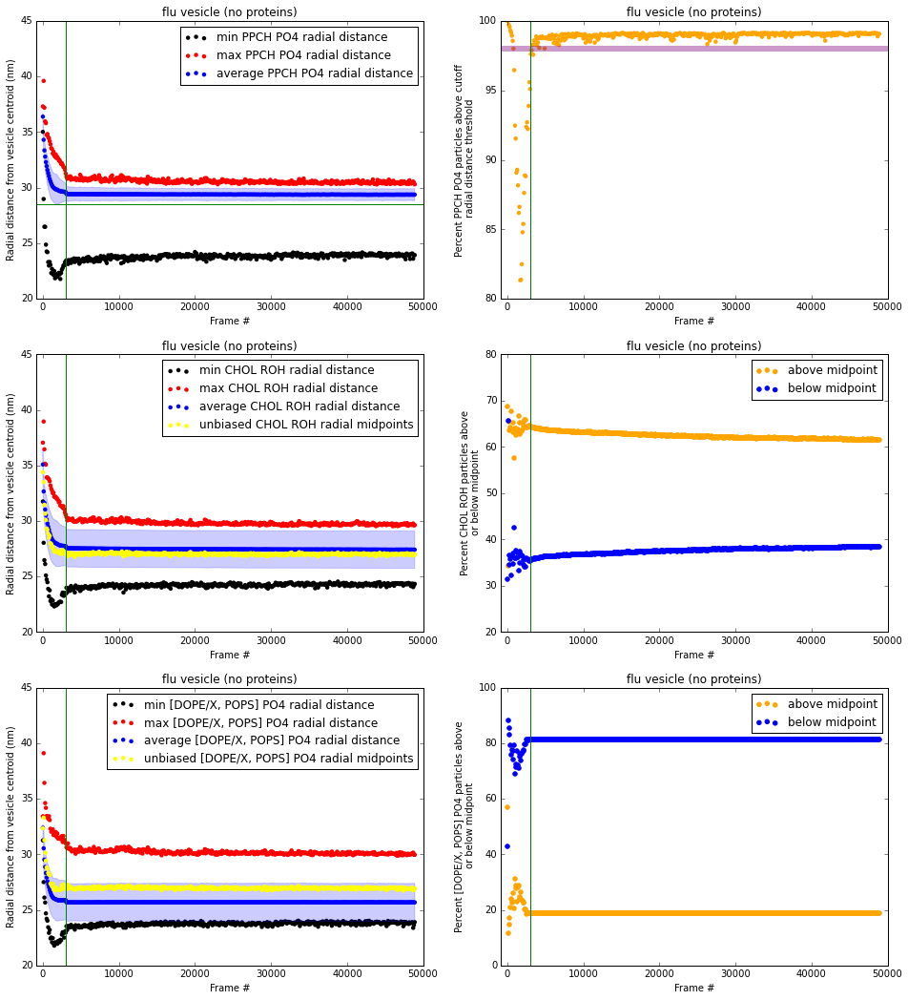

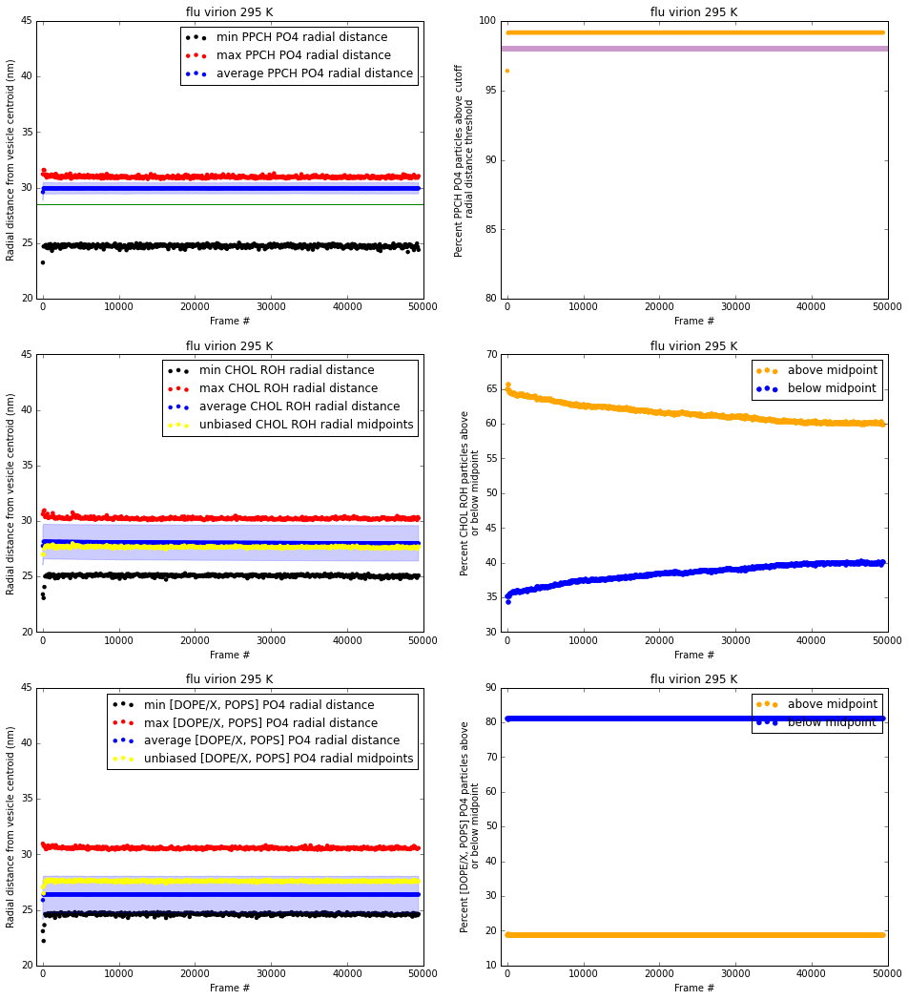

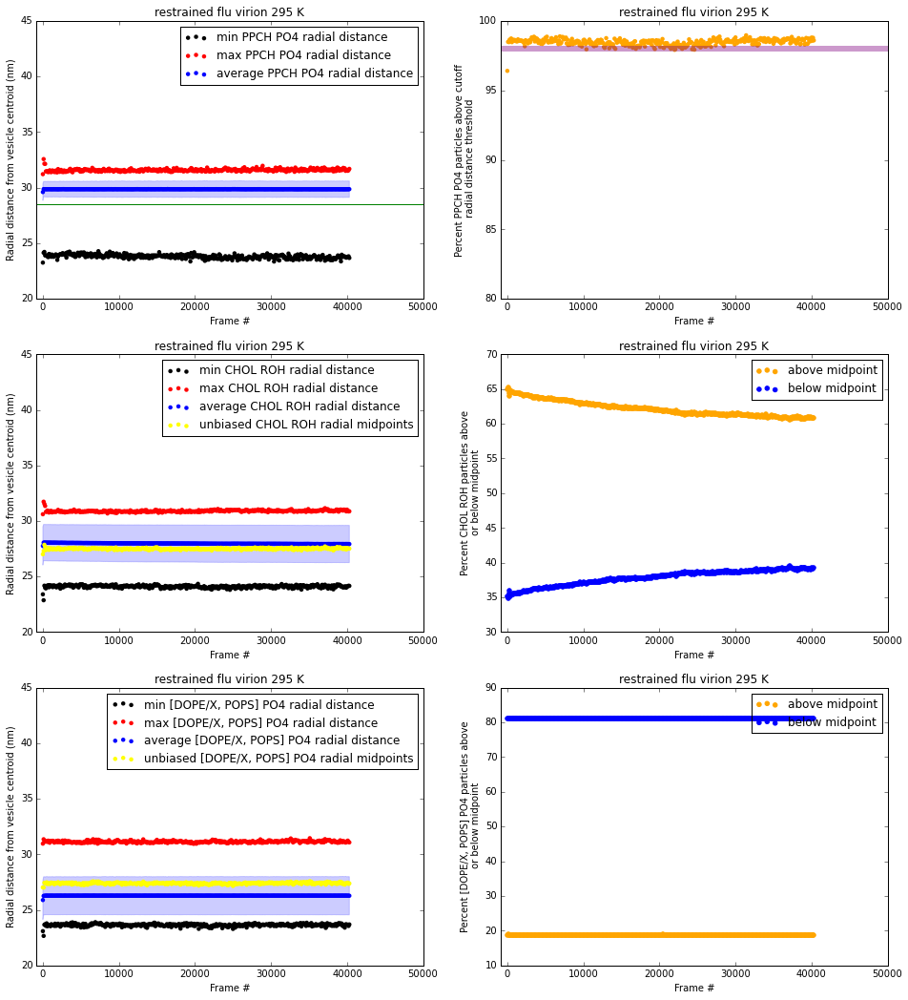

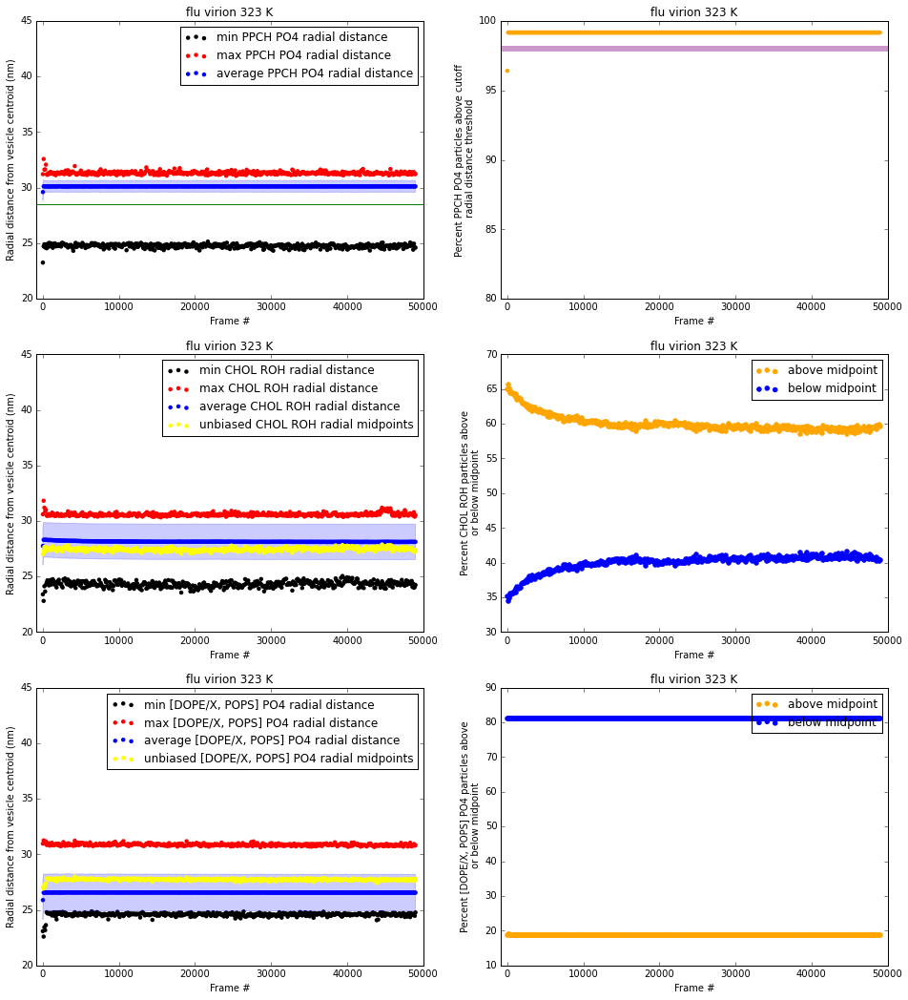

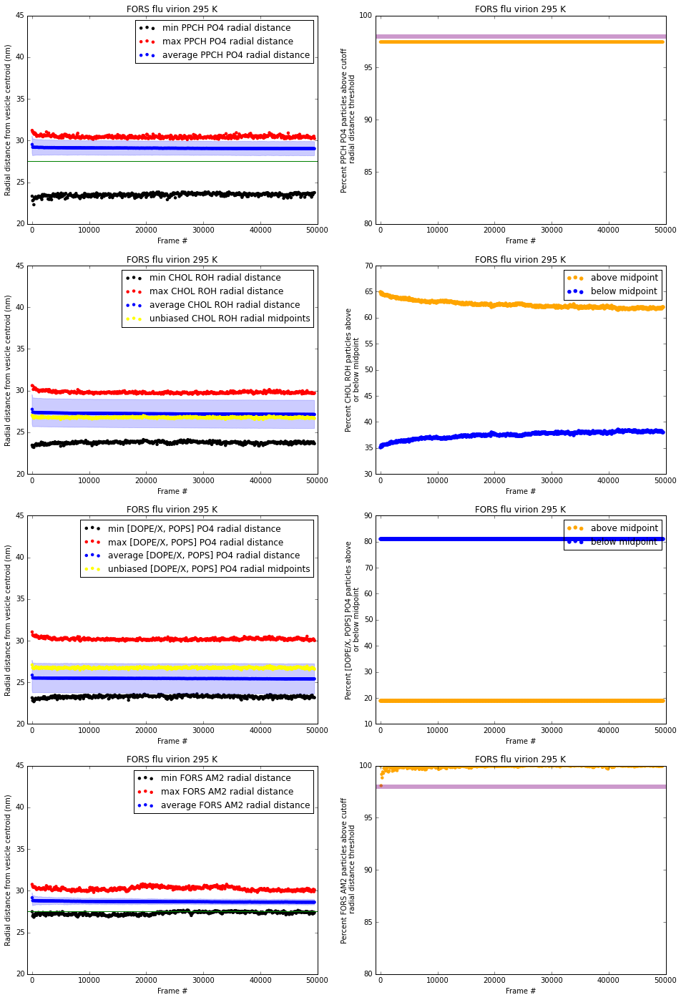

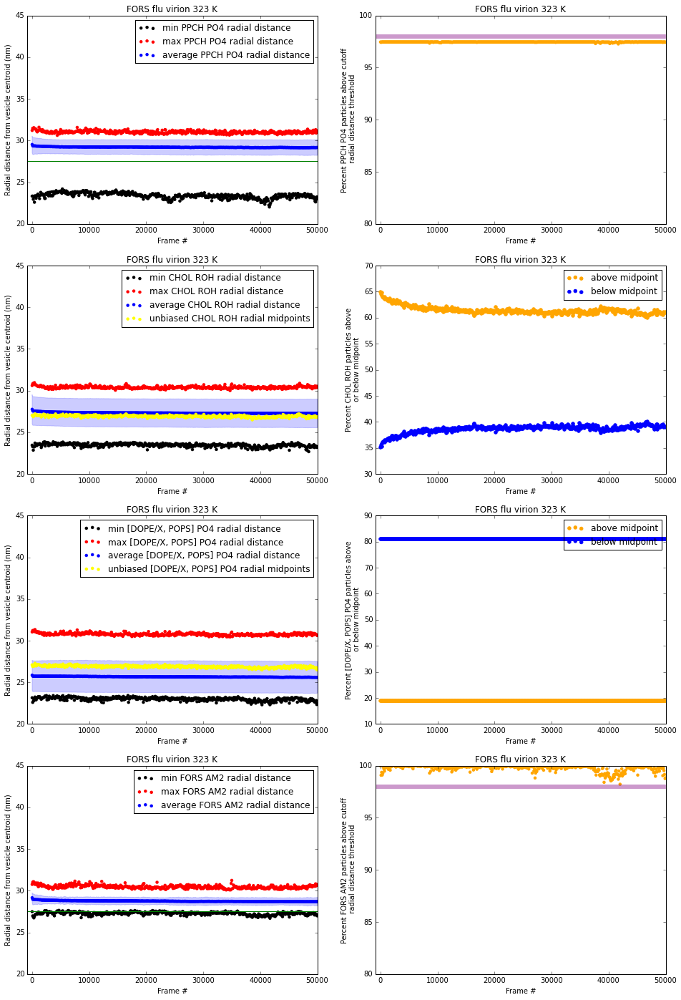

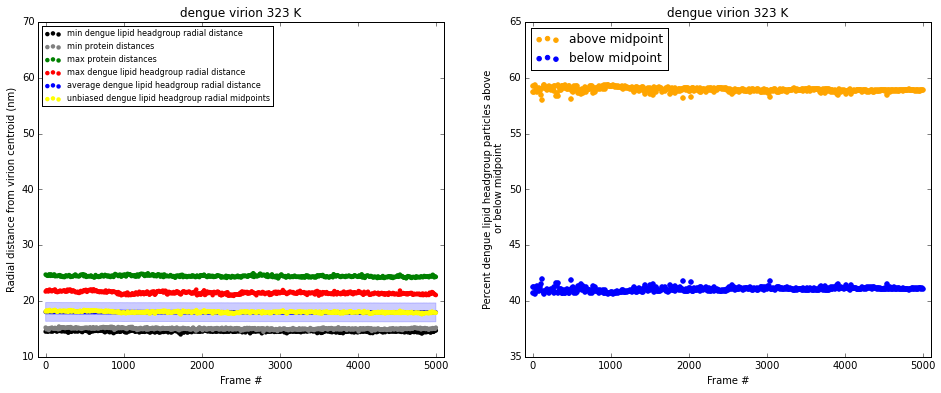

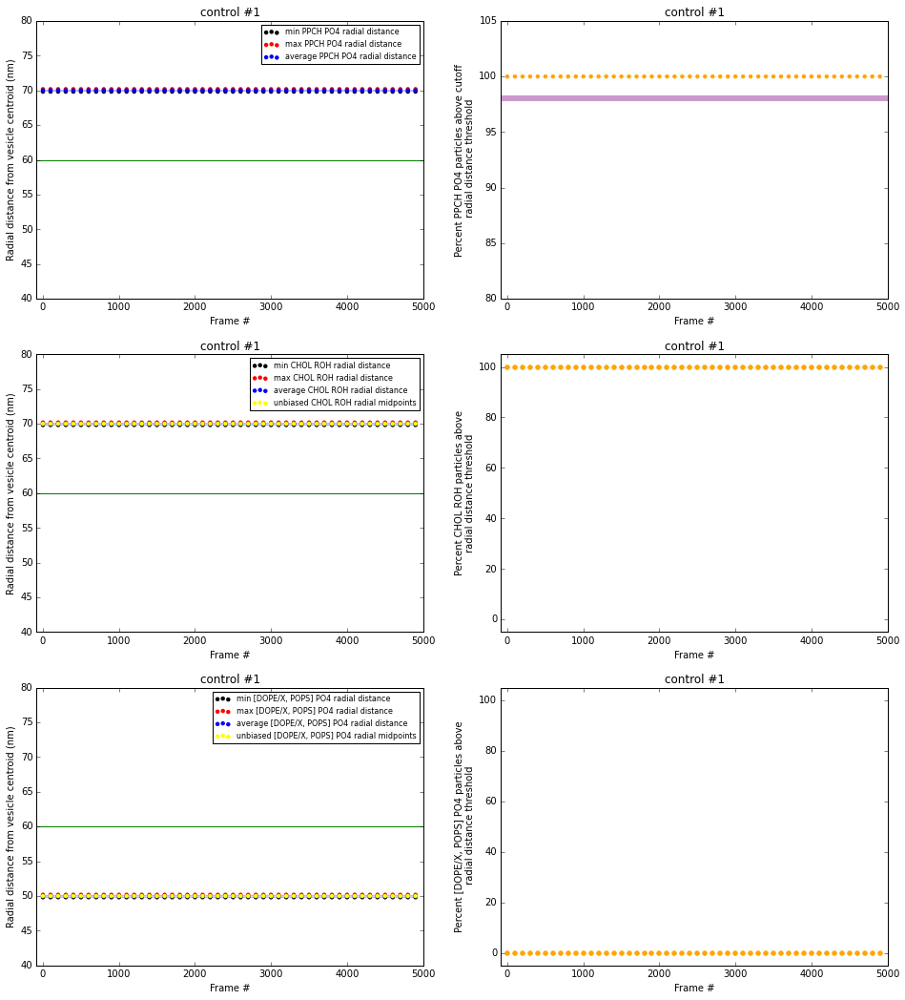

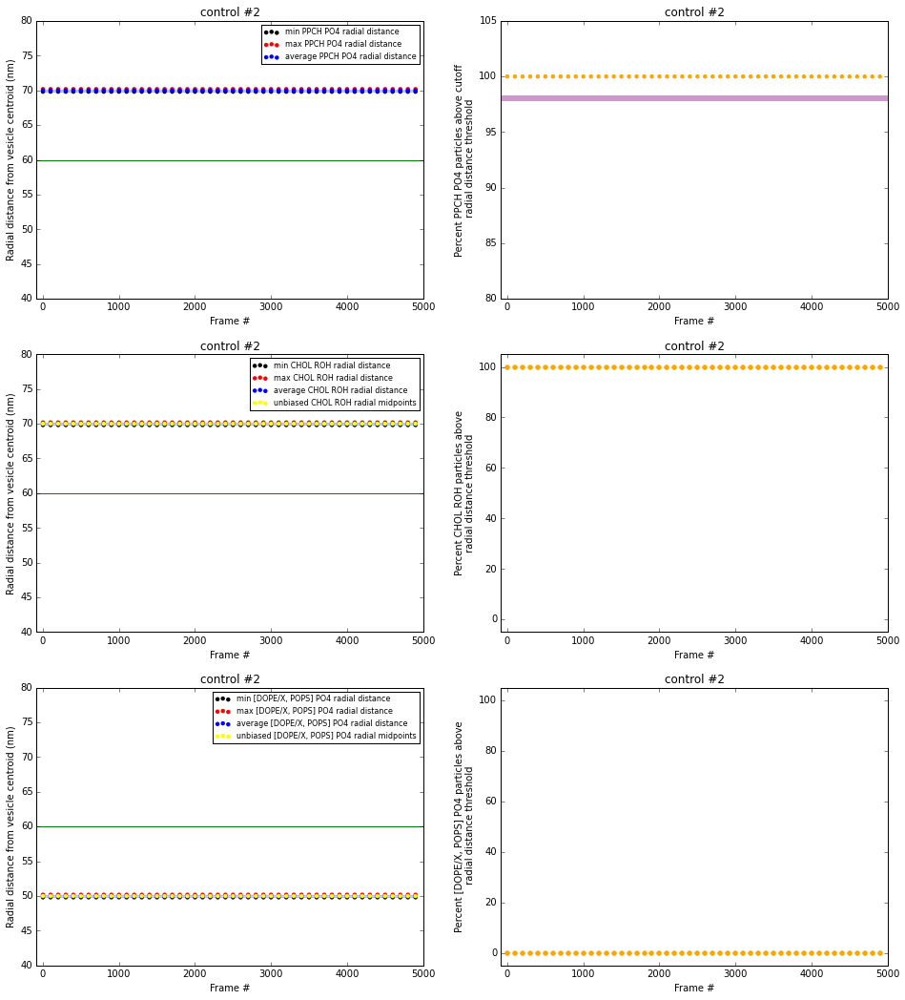

In [52]:
import voronoi_analysis_library
#plot the testing data produced above:
fig_sim33 = plt.figure()
sim33_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim33,list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold)
sim33_radial_assessment_instance.plot('flu vesicle (no proteins)',equil_line=1)
#test plot for sim35:
fig_sim35 = plt.figure()
sim35_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim35,sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold)
sim35_radial_assessment_instance.plot('flu virion 295 K')
#test plot for sim36:
fig_sim36 = plt.figure()
sim36_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim36,sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold)
sim36_radial_assessment_instance.plot('restrained flu virion 295 K')
#test plot for sim37:
fig_sim37 = plt.figure()
sim37_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim37,sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold)
sim37_radial_assessment_instance.plot('flu virion 323 K')
#test plot for sim38:
fig_sim38 = plt.figure()
sim38_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim38,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_frame_numbers,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold,sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_FORS_percent_above_treshold,FORS_present=1)
sim38_radial_assessment_instance.plot('FORS flu virion 295 K')
#test plot for sim39:
fig_sim39 = plt.figure()
sim39_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_sim39,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_frame_numbers,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold,sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_FORS_percent_above_treshold,FORS_present=1)
sim39_radial_assessment_instance.plot('FORS flu virion 323 K')
#test plot for dengue:
fig_dengue = plt.figure()
dengue_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment_dengue(fig_dengue,dengue_list_frame_numbers,list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,list_dengue_lipid_headgroup_midpoint_distances,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_min_protein_distances,list_max_protein_distances)
dengue_radial_assessment_instance.plot('dengue virion 323 K')
#test plot for control #1:
fig_control_1 = plt.figure()
control_1_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_control_1,control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold,control_condition=1)
control_1_radial_assessment_instance.plot('control #1')
#test plot for control #2:
fig_control_2 = plt.figure()
control_2_radial_assessment_instance = voronoi_analysis_library.radial_distance_assessment(fig_control_2,control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold,control_condition=1)
control_2_radial_assessment_instance.plot('control #2')

In [796]:
#try to create a simple dengue trajectory movie to assess the proposed presence of 'floater' lipids outside the virion proper (causing the radial distance spikes observed above)
engine_dengue.execute("reload(voronoi_analysis_library)")
ar_dengue_movie = engine_dengue.execute("voronoi_analysis_library.create_dengue_trajectory_movie(universe_object)")

In [820]:
ar_dengue_movie.ready() #seems to take quite a while to produce the movie

True

In [821]:
ar_dengue_movie.get()

In [108]:
#display the dengue movie produced above as an HTML5 video below:
from IPython.display import HTML
HTML("""<video controls> <source src="./dengue_assess_lipid_headgroups.mp4" type="video/mp4"> </video>""")

Clearly, we can capture > 98 % of the PPCH PO4 particles by requiring that radial distance exceeds 28.5 nm (just outside 1 standard deviation from the average for PPCH PO4). This isn't surprising given that PPCH was initially placed entirely in the outer leaflet and only a small amount of PPCH flipped to inner leaflet during equilibration. So, one thing we might want to do for the outer leaflet is project all headgroup particles to the average of PPCH PO4. For PPCH PO4, this would mean taking all particles > 28.5 nm and projecting to the average value (to avoid projecting inner leaflet outliers).

For CHOL ROH particles I think it is most sensible to use the unbiased midpoint of the max and min radial distances in a given frame as the threshold for determination of leaflet assignment. So, if a CHOL ROH particle falls above the midpoint threshold in a given frame, it should be projected up to the PPCH PO4 average radial distance (and check that there are no steric conflicts after projection).

For the minor outer leaflet species (POPS, DOPX, DOPE) it also seems sensible to use an unbiased midpoint cutoff. In a given frame PO4 particles would then be projected up or down to the average value of the appropriate leaflet. My current focus is the outer leaflet where we would probably aim to project everything up to the PPCH PO4 average radial distance (again, need to check for steric conflicts after projection).

I've now expanded this analysis to include the flu virion at 295 K, and the results look quite similar--I think it may be possible to use similar leaflet assignment and projection criteria.

In [56]:
#import time
#start_time = time.time()
#%%prun -T bench.txt
#testing abstraction / generalization of above large Voronoi analysis loop code:
#now testing asychronous parallel workflow for sims33/35
engine_sim33.execute('reload(voronoi_analysis_library)')
engine_sim35.execute('reload(voronoi_analysis_library)')
ar_sim35 = engine_sim35.execute("sim35_list_frame_numbers_stage_2,sim35_list_percent_surface_area_reconstitution_from_lipids_only,sim35_list_percent_surface_area_reconstitution_from_proteins_only,sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim35_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")
ar_sim33 = engine_sim33.execute("sim33_list_frame_numbers_stage_2,sim33_list_percent_surface_area_reconstitution,sim33_list_percent_surface_area_reconstitution_inner_leaflet,sim33_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,3000,'full',1000,PPCH_PO4_threshold=285,proteins_present='no')")
#block until both results are ready (for proper benchmark,etc.)
#dview.wait([ar_sim35,ar_sim33])
#end_time = time.time()
#print 'execution time (seconds):', end_time - start_time

In [57]:
#test area per molecule analysis on control condition #1:
engine_control_1.execute("reload(voronoi_analysis_library)")
ar_control_1 = engine_control_1.execute("control_1_list_frame_numbers_stage_2,control_1_list_percent_surface_area_reconstitution,control_1_list_percent_surface_area_reconstitution_inner_leaflet,control_1_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,control_condition=1)") #stage 2 specifier to avoid namespace conflict with precursor analysis


In [58]:
#test area per molecule analysis on control condition #2:
engine_control_2.execute("reload(voronoi_analysis_library)")
ar_control_2 = engine_control_2.execute("control_2_list_frame_numbers_stage_2,control_2_list_percent_surface_area_reconstitution,control_2_list_percent_surface_area_reconstitution_inner_leaflet,control_2_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,control_condition=1)") #stage 2 specifier to avoid namespace conflict with precursor analysis


In [59]:
#expand area per molecule analysis to include sims 36/37 by performing asynchronous parallel calculation on their respective engines:
engine_sim36.execute('reload(voronoi_analysis_library)')
engine_sim37.execute('reload(voronoi_analysis_library)')
ar_sim36 = engine_sim36.execute("sim36_list_frame_numbers_stage_2,sim36_list_percent_surface_area_reconstitution_from_lipids_only,sim36_list_percent_surface_area_reconstitution_from_proteins_only,sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim36_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")
ar_sim37 = engine_sim37.execute("sim37_list_frame_numbers_stage_2,sim37_list_percent_surface_area_reconstitution_from_lipids_only,sim37_list_percent_surface_area_reconstitution_from_proteins_only,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim37_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")



In [60]:
#expand area per molecule analysis to include sims38/39 once voronoi_analysis_library.voronoi_analysis_loop() function has been expanded to work properly with FORS residues
engine_sim38.execute('reload(voronoi_analysis_library)')
engine_sim39.execute('reload(voronoi_analysis_library)')
#currently just testing the new FORS-adjusted code (expecting at least one or two problems):
ar_sim38 = engine_sim38.execute("sim38_list_frame_numbers_stage_2,sim38_list_percent_surface_area_reconstitution_from_lipids_only,sim38_list_percent_surface_area_reconstitution_from_proteins_only,sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim38_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=275,proteins_present='yes',FORS_present='yes')")
ar_sim39 = engine_sim39.execute("sim39_list_frame_numbers_stage_2,sim39_list_percent_surface_area_reconstitution_from_lipids_only,sim39_list_percent_surface_area_reconstitution_from_proteins_only,sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim39_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=275,proteins_present='yes',FORS_present='yes')")


In [61]:
#now expand area per molecule analysis to include the dengue trajectory (testing phase)
engine_dengue.execute('reload(voronoi_analysis_library)')
ar_dengue = engine_dengue.execute("dengue_list_frame_numbers_stage_2,dengue_list_percent_surface_area_reconstitution_from_lipids_only,dengue_list_percent_surface_area_reconstitution_from_proteins_only,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,proteins_present='yes',dengue_condition=1)")

In [91]:
(ar_sim33.ready(),ar_sim35.ready(),ar_sim36.ready(),ar_sim37.ready(),ar_sim38.ready(),ar_sim39.ready(),ar_control_1.ready(),ar_control_2.ready(),ar_dengue.ready())

(True, True, True, True, True, True, True, True, True)

In [145]:
(ar_control_1.ready(),ar_control_2.ready())

(True, True)

In [92]:
ar_control_2.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [153]:
ar_control_1.get()

In [372]:
#rough profiling work / notes for block of code above (for parsing of a small subset of the frames only-- :3000:1000 for sim35 & 3000:5000:1000 for sim33)
#January 30/ 2015 ~12:50pm: 994.227 seconds
#January 30/ 2015 ~1:32pm (attempted to remove redundancy from sim35 workflow): 795.034 seconds
#January 30/ 2015 ~1:55 (attempted to remove redundancy from both sim33+35 workflows): 604.446 seconds
#January 31/ 2015 ~10:38pm (after abstraction of large Voronoi loop--includes more previous content so expect slightly more time for execution): 623.602 seconds
#February 2/ 2015 ~1:40pm (parsing sims33/35 on two different / parallel IPython engines [cores]): 340.3 seconds





In [93]:
#pull out the Voronoi data parsed on various IPython engines (other cores):
sim35_list_frame_numbers_stage_2,sim35_list_percent_surface_area_reconstitution_from_lipids_only,sim35_list_percent_surface_area_reconstitution_from_proteins_only,sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim35_dictionary_headgroup_data = [engine_sim35[key] for key in ["sim35_list_frame_numbers_stage_2","sim35_list_percent_surface_area_reconstitution_from_lipids_only","sim35_list_percent_surface_area_reconstitution_from_proteins_only","sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim35_dictionary_headgroup_data"]]
sim33_list_frame_numbers_stage_2,sim33_list_percent_surface_area_reconstitution,sim33_list_percent_surface_area_reconstitution_inner_leaflet,sim33_dictionary_headgroup_data = [engine_sim33[key] for key in ["sim33_list_frame_numbers_stage_2","sim33_list_percent_surface_area_reconstitution","sim33_list_percent_surface_area_reconstitution_inner_leaflet","sim33_dictionary_headgroup_data"]]


In [94]:
#now pull out the Voronoi data from additional simulation conditions (sims36/37):
sim36_list_frame_numbers_stage_2,sim36_list_percent_surface_area_reconstitution_from_lipids_only,sim36_list_percent_surface_area_reconstitution_from_proteins_only,sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim36_dictionary_headgroup_data = [engine_sim36[key] for key in ["sim36_list_frame_numbers_stage_2","sim36_list_percent_surface_area_reconstitution_from_lipids_only","sim36_list_percent_surface_area_reconstitution_from_proteins_only","sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim36_dictionary_headgroup_data"]]
sim37_list_frame_numbers_stage_2,sim37_list_percent_surface_area_reconstitution_from_lipids_only,sim37_list_percent_surface_area_reconstitution_from_proteins_only,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim37_dictionary_headgroup_data = [engine_sim37[key] for key in ["sim37_list_frame_numbers_stage_2","sim37_list_percent_surface_area_reconstitution_from_lipids_only","sim37_list_percent_surface_area_reconstitution_from_proteins_only","sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim37_dictionary_headgroup_data"]]

In [95]:
#now pull out the Voronoi data from additional simulation conditions (sims38/39):
sim38_list_frame_numbers_stage_2,sim38_list_percent_surface_area_reconstitution_from_lipids_only,sim38_list_percent_surface_area_reconstitution_from_proteins_only,sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim38_dictionary_headgroup_data = [engine_sim38[key] for key in ["sim38_list_frame_numbers_stage_2","sim38_list_percent_surface_area_reconstitution_from_lipids_only","sim38_list_percent_surface_area_reconstitution_from_proteins_only","sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim38_dictionary_headgroup_data"]]
sim39_list_frame_numbers_stage_2,sim39_list_percent_surface_area_reconstitution_from_lipids_only,sim39_list_percent_surface_area_reconstitution_from_proteins_only,sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim39_dictionary_headgroup_data = [engine_sim39[key] for key in ["sim39_list_frame_numbers_stage_2","sim39_list_percent_surface_area_reconstitution_from_lipids_only","sim39_list_percent_surface_area_reconstitution_from_proteins_only","sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim39_dictionary_headgroup_data"]]


In [96]:
#pull out the Voronoi data from the dengue simulation condition:
dengue_list_frame_numbers_stage_2,dengue_list_percent_surface_area_reconstitution_from_lipids_only,dengue_list_percent_surface_area_reconstitution_from_proteins_only,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_dictionary_headgroup_data = [engine_dengue[key] for key in ["dengue_list_frame_numbers_stage_2","dengue_list_percent_surface_area_reconstitution_from_lipids_only","dengue_list_percent_surface_area_reconstitution_from_proteins_only","dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","dengue_dictionary_headgroup_data"]]


In [97]:
#now pull back Voronoi data for the two control conditions
control_1_list_frame_numbers_stage_2,control_1_list_percent_surface_area_reconstitution,control_1_list_percent_surface_area_reconstitution_inner_leaflet,control_1_dictionary_headgroup_data = [engine_control_1[key] for key in ["control_1_list_frame_numbers_stage_2","control_1_list_percent_surface_area_reconstitution","control_1_list_percent_surface_area_reconstitution_inner_leaflet","control_1_dictionary_headgroup_data"]]
control_2_list_frame_numbers_stage_2,control_2_list_percent_surface_area_reconstitution,control_2_list_percent_surface_area_reconstitution_inner_leaflet,control_2_dictionary_headgroup_data = [engine_control_2[key] for key in ["control_2_list_frame_numbers_stage_2","control_2_list_percent_surface_area_reconstitution","control_2_list_percent_surface_area_reconstitution_inner_leaflet","control_2_dictionary_headgroup_data"]]

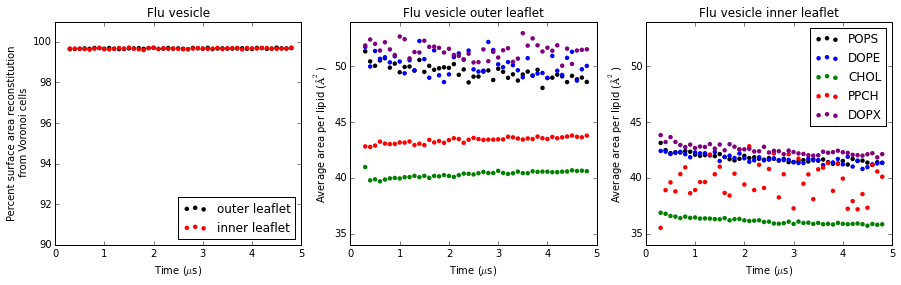

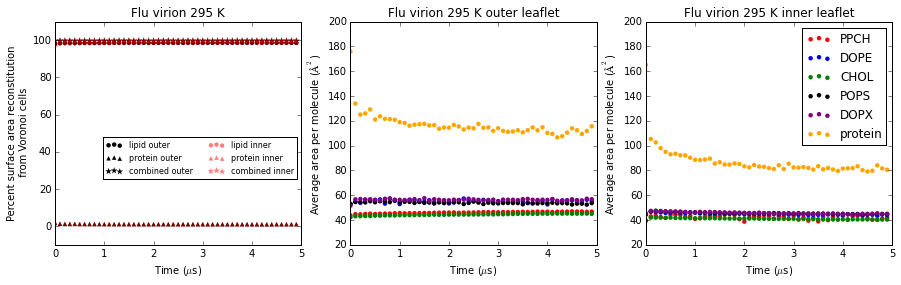

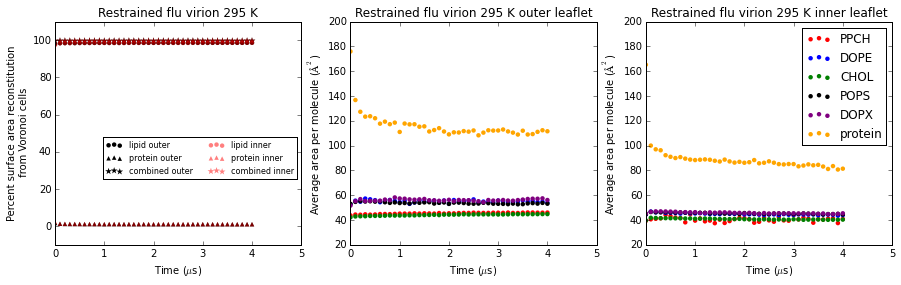

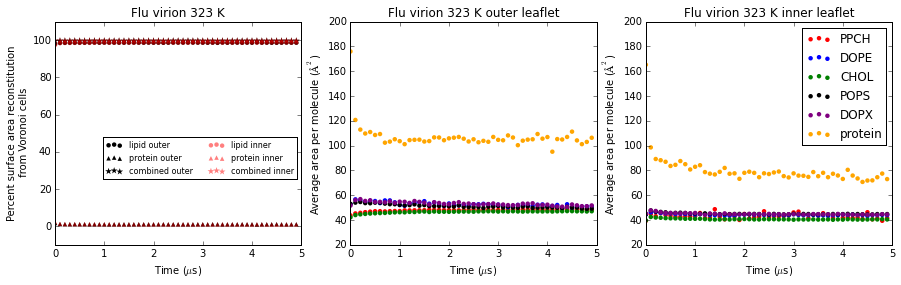

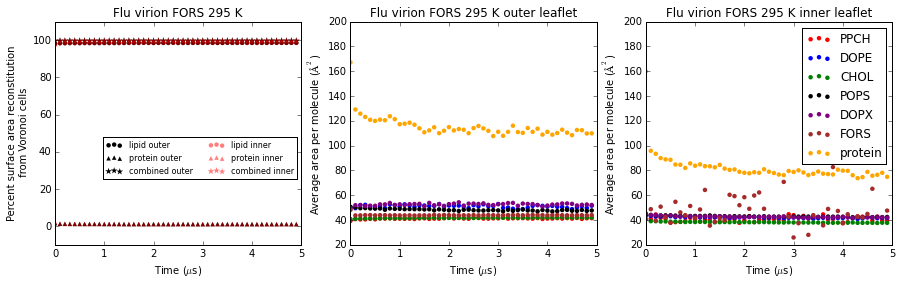

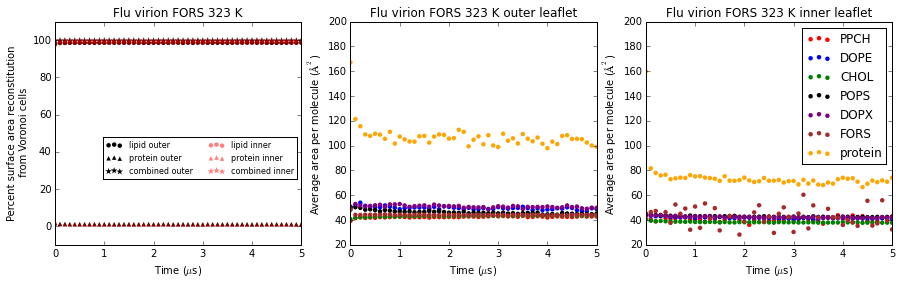

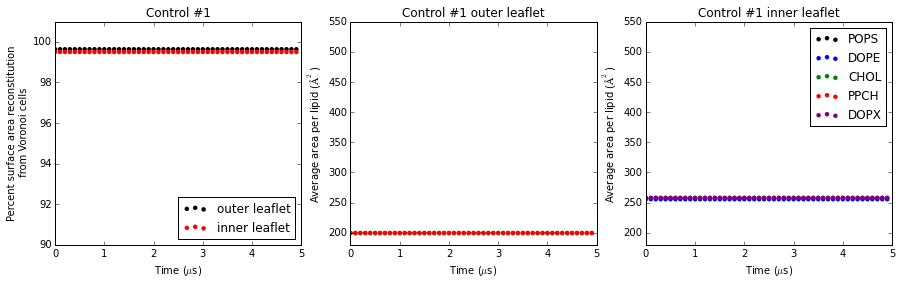

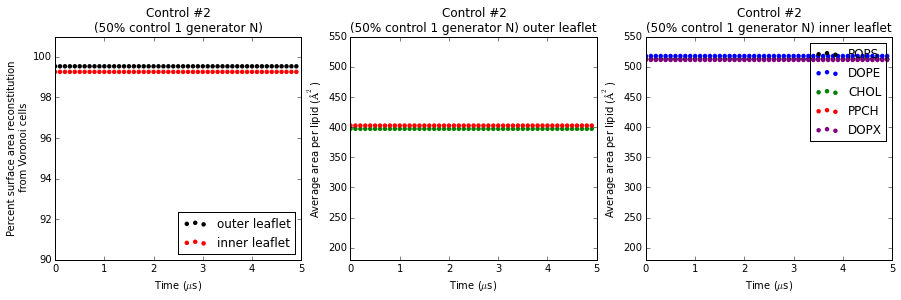

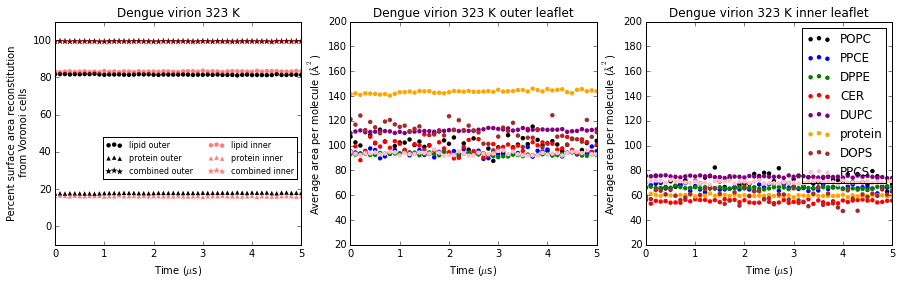

In [123]:
#start plotting test vesicle outer leaflet voronoi analysis results from above (now working to add inner leaflet results as well)
#now working to add plots for preliminary sim35 Voronoi parsing results

#plot sim33 area per molecule results:
fig2 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig2,list_frame_numbers=sim33_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=sim33_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=sim33_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Flu vesicle',dictionary_headgroup_data=sim33_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None)
#plot sim35 area per molecule results:
fig3 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig3,list_frame_numbers=sim35_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 295 K',dictionary_headgroup_data=sim35_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim35_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim35_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim36 area per molecule results:
fig4 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig4,list_frame_numbers=sim36_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Restrained flu virion 295 K',dictionary_headgroup_data=sim36_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim36_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim36_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim37 area per molecule results:
fig5 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig5,list_frame_numbers=sim37_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 323 K',dictionary_headgroup_data=sim37_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim37_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim37_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim38 area per molecule results:
fig6 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig6,list_frame_numbers=sim38_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion FORS 295 K',dictionary_headgroup_data=sim38_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim38_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim38_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim39 area per molecule results:
fig7 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig7,list_frame_numbers=sim39_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion FORS 323 K',dictionary_headgroup_data=sim39_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim39_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim39_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot control #1 area per molecule results:
fig8 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig8,list_frame_numbers=control_1_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=control_1_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=control_1_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Control #1',dictionary_headgroup_data=control_1_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None,control_condition=1)
#plot control #2 area per molecule results:
fig9 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig9,list_frame_numbers=control_2_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=control_2_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=control_2_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Control #2\n(50% control 1 generator N)',dictionary_headgroup_data=control_2_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None,control_condition=1)
#plot dengue area per molecule results:
fig10 = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig10,list_frame_numbers=dengue_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Dengue virion 323 K',dictionary_headgroup_data=dengue_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=dengue_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=dengue_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_condition=1)

The above plots are a good start for the flu vesicle outer leaflet voronoi parsing. The area per molecule values look more reasonable now. For example, previous DPD simulations for CHOL gave an area of 40.3 A$^2$ (de Meyer and Smit, 2009), and previous monolayer experiments produced an area of 41 A$^2$ for CHOL (Brzozowska and Figaszewski, 2002). Note that the area per molecule plot isn't currently displaying the standard deviations values, which are very large. That might be something to investigate.

The flu vesicle inner leaflet results are now included as well. As with the outer leaflet, the % surface area reconstitution from the Voronoi cells is excellent. The area per molecule for the inner leaflet shows evidence of really tight packing -- CHOL is well below the usual ~40 A$^2$ value, and all lipids seem to be dipping to tighter packing over the course of the 5 $\mu$s simulation. While one might argue that this is evidence that the system has not equilibrated, there is little we can do about this because of the computational cost of the simulations (and most biophysical parameters did appear to be stable). As with the outer leaflet, it will likely eventually be of interest to investigate the standard deviation of the area per molecule values. Finally, I will probably want to firmly establish the basis of the large fluctuations for inner leaflet PPCH -- my suspicion is that this is simply the result of an extremely low PPCH population in this leaflet. 

time to produce plots: 40.4049251835 minutes


/sansom/n22/bioc1009/anaconda_python/anaconda/lib/python2.7/site-packages/matplotlib/axes/_axes.py:475: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


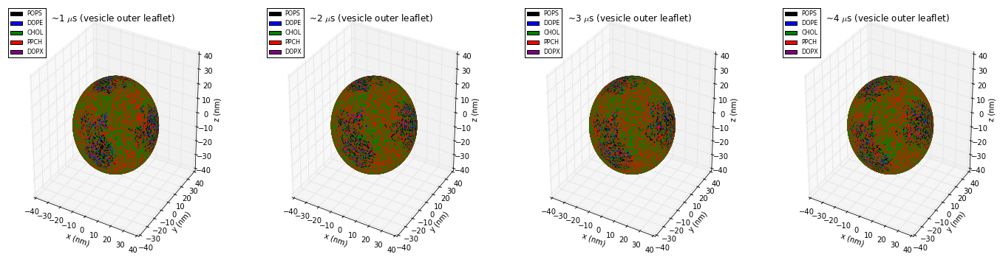

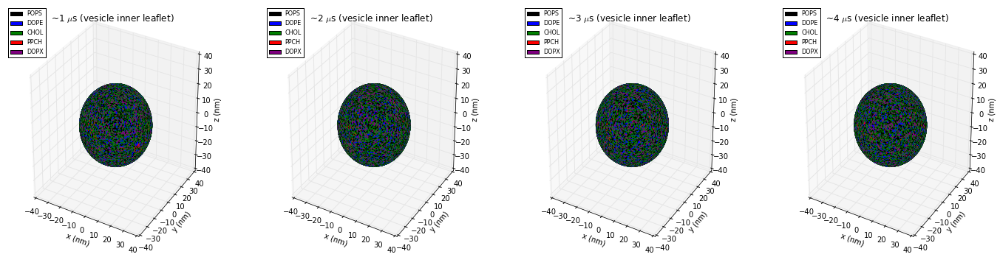

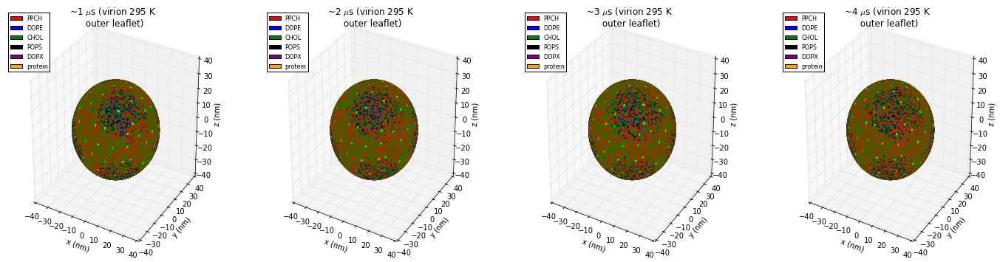

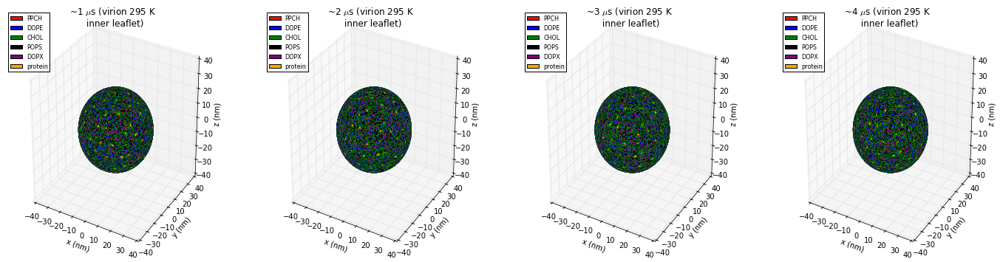

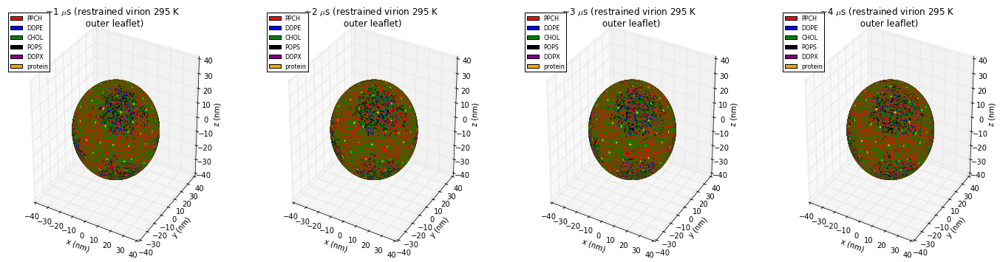

...

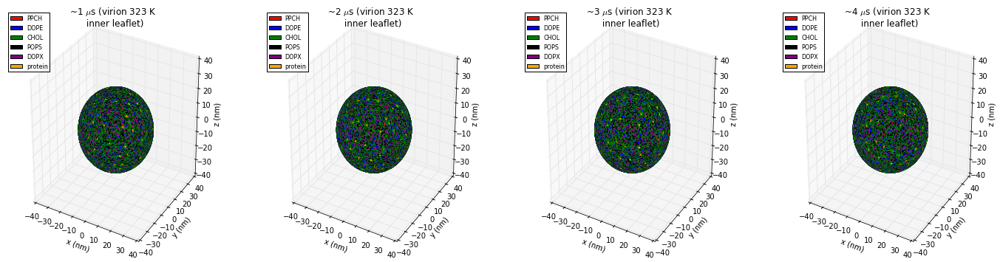

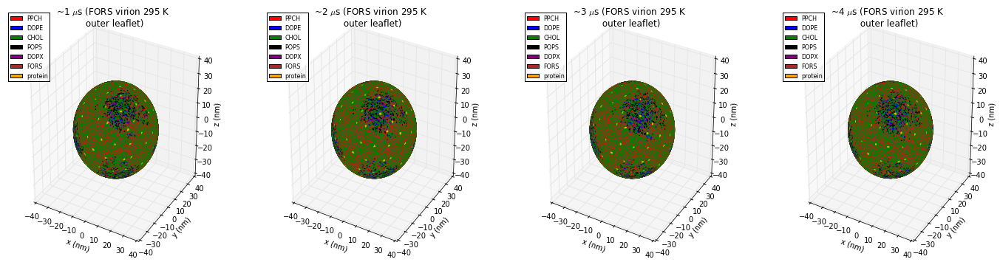

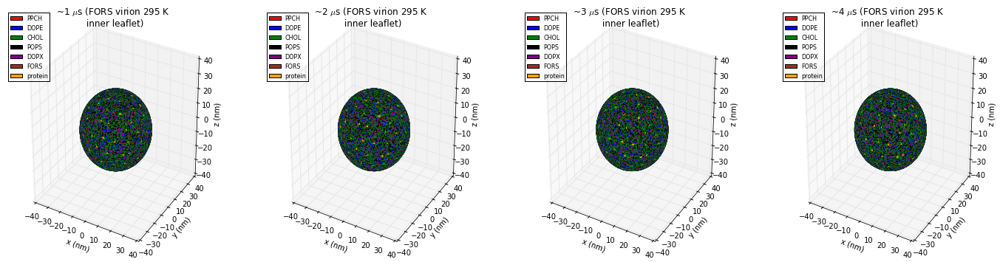

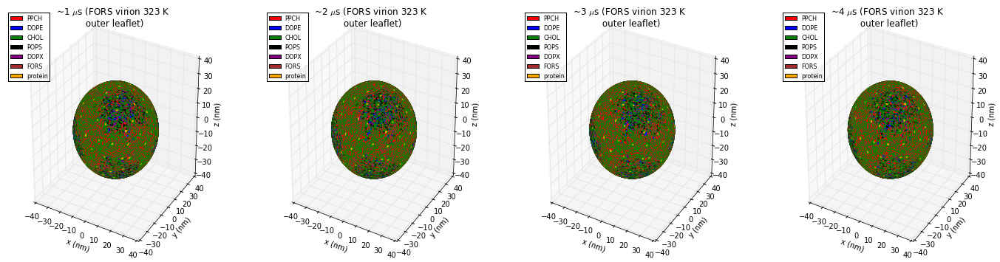

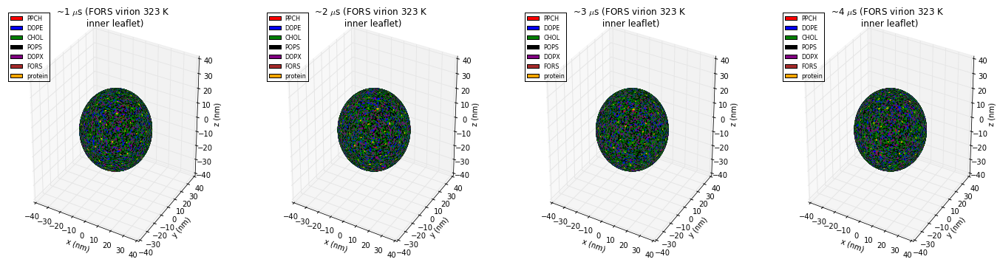

In [99]:
#now for sample spherical Voronoi diagrams for flu vesicle outer leaflet parsing (now working to include inner leaflet as well)
import time
start_time = time.time()

#flu vesicle outer leaflet:
fig3 = plt.figure()
list_voronoi_indices = [7,17,27,37] #start ~ 1 microsecond and work toward ~4 microseconds by skipping 10 indices each time (note that the index values are sensitive to the coarseness of the data parsing prior to this code)
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig3,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','vesicle outer leaflet',sim33_dictionary_headgroup_data)

#flu vesicle inner leaflet:
fig4 = plt.figure()
list_voronoi_indices = [7,17,27,37] #start ~ 1 microsecond and work toward ~4 microseconds by skipping 10 indices each time (note that the index values are sensitive to the coarseness of the data parsing prior to this code)
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig4,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','vesicle inner leaflet',sim33_dictionary_headgroup_data)

#sim35 outer leaflet
fig5 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig5,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 295 K\n outer leaflet',sim35_dictionary_headgroup_data)

#sim35 inner leaflet
fig6 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig6,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 295 K\n inner leaflet',sim35_dictionary_headgroup_data)

#sim36 outer leaflet
fig_sim36_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] #sim36 is shorter so maybe have to be careful here
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim36_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','restrained virion 295 K\n outer leaflet',sim36_dictionary_headgroup_data)

#sim36 inner leaflet
fig_sim36_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim36_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','restrained virion 295 K\n inner leaflet',sim36_dictionary_headgroup_data)

#sim37 outer leaflet
fig_sim37_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim37_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)

#sim37 inner leaflet
fig_sim37_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim37_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

#sim38 outer leaflet
fig_sim38_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim38_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 295 K\n outer leaflet',sim38_dictionary_headgroup_data)

#sim38 inner leaflet
fig_sim38_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim38_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 295 K\n inner leaflet',sim38_dictionary_headgroup_data)

#sim39 outer leaflet
fig_sim39_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim39_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 323 K\n outer leaflet',sim39_dictionary_headgroup_data)

#sim39 inner leaflet
fig_sim39_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim39_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 323 K\n inner leaflet',sim39_dictionary_headgroup_data)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

time to produce plots: 1.09869368076 minutes


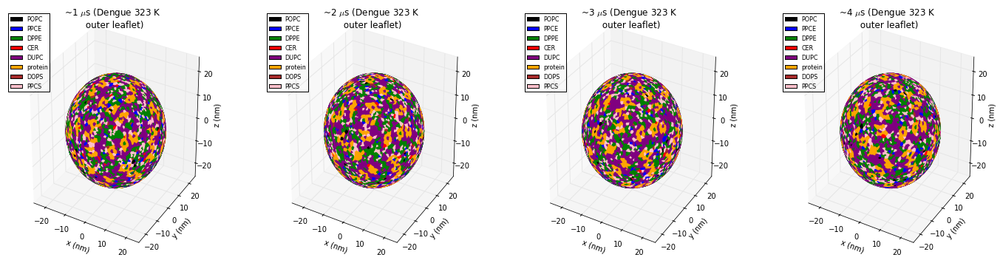

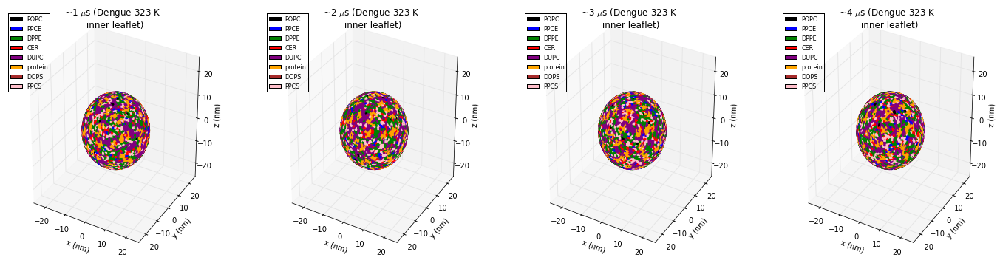

In [100]:
#dengue Voronoi plots (testing phase)
import time #takes a long time to generate these plots -- quantify this while I'm testing dengue plots
start_time = time.time()

fig_dengue_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_dengue_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

fig_dengue_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_dengue_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

time to produce plots: 10.4632976492 minutes


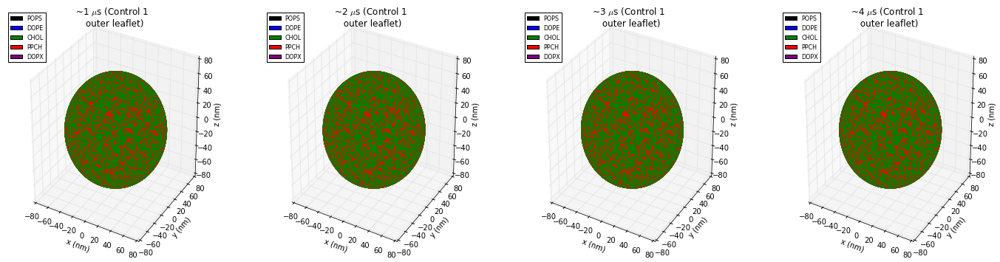

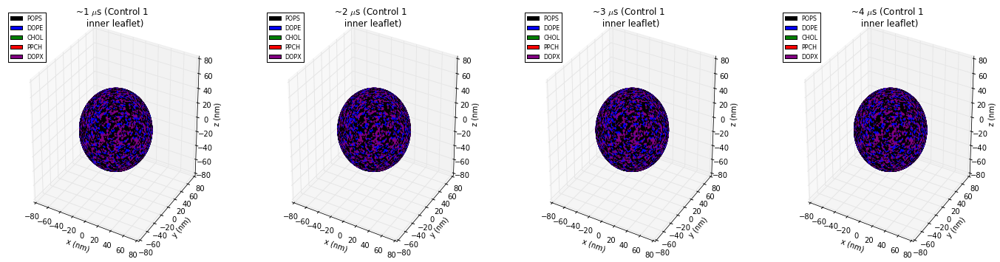

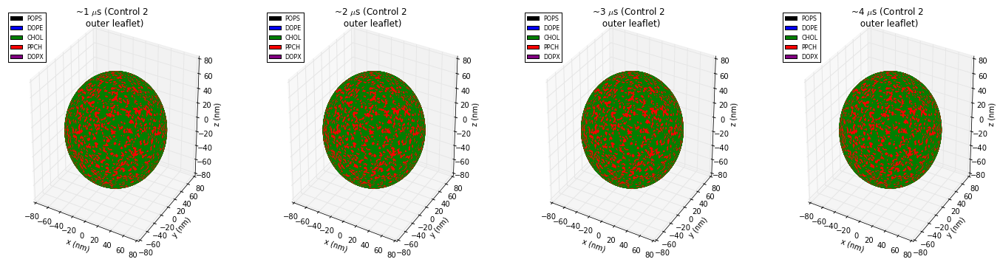

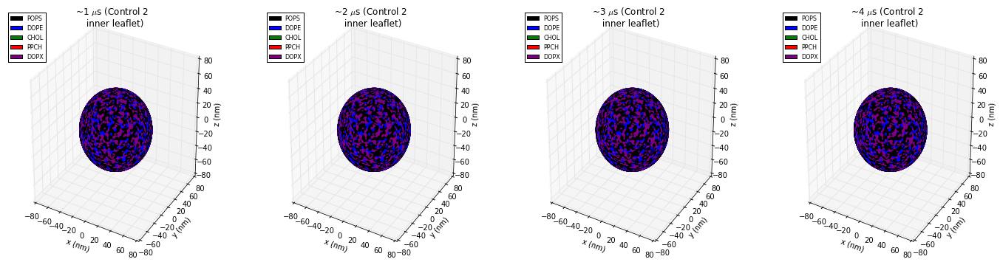

In [101]:
#control Voronoi plots:
import time 
start_time = time.time()

fig_control_1_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_1_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 1 \n outer leaflet',control_1_dictionary_headgroup_data,control_condition=1)

fig_control_1_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_1_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 1 \n inner leaflet',control_1_dictionary_headgroup_data,control_condition=1)

fig_control_2_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_2_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 2 \n outer leaflet',control_2_dictionary_headgroup_data,control_condition=1)

fig_control_2_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_control_2_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 2 \n inner leaflet',control_2_dictionary_headgroup_data,control_condition=1)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

The Voronoi diagrams from the flu vesicle simulation (outer leaflet) look quite sensible. CHOL and PPCH dominate, as expected. The domain segregation is almost certainly the result of the inner leaflet species involuting to the outer leaflet during equilibration / hole closure. By visual inspection, it is actually rather difficult to find any differences between these diagrams from different time points. This is also not particularly surprising given the extremely high CHOL concentration and the extremely slow diffusion of the lipid species.

The next logical step will probably be to extend the analysis workflow above to include the flu vesicle *inner* leaflet.

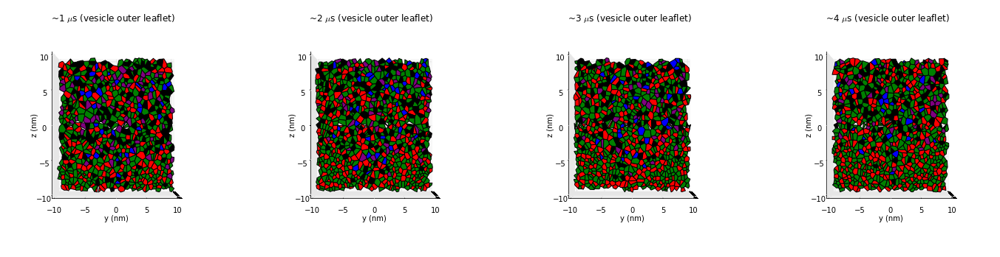

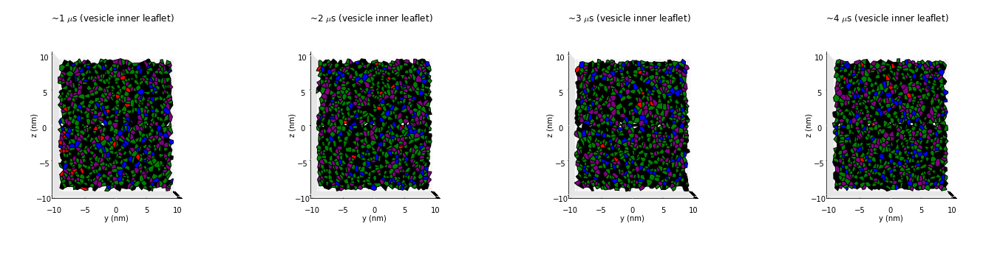

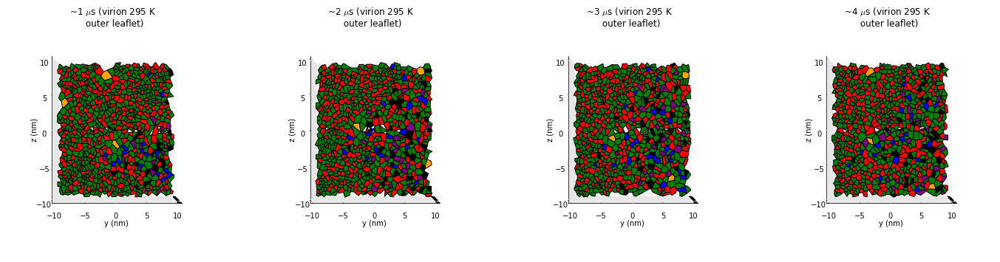

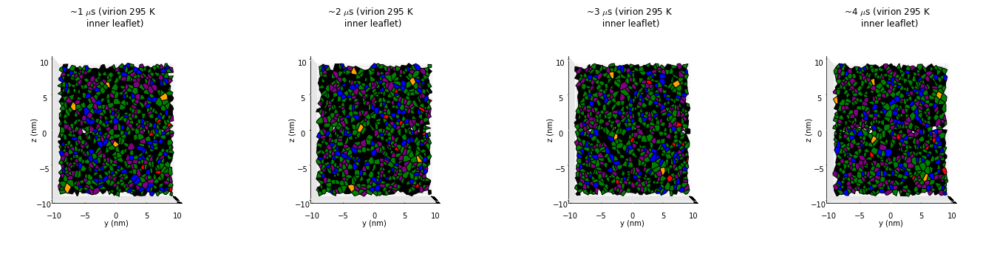

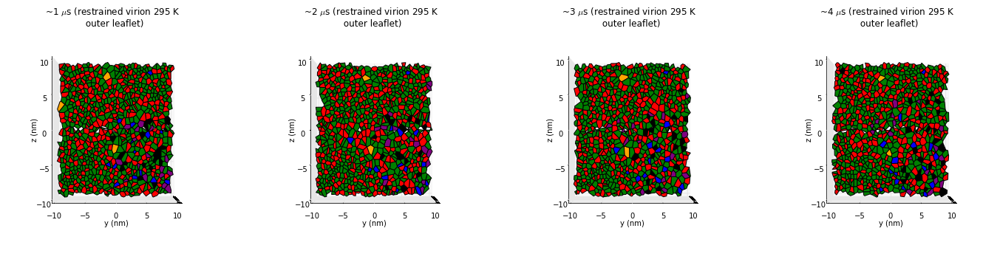

...

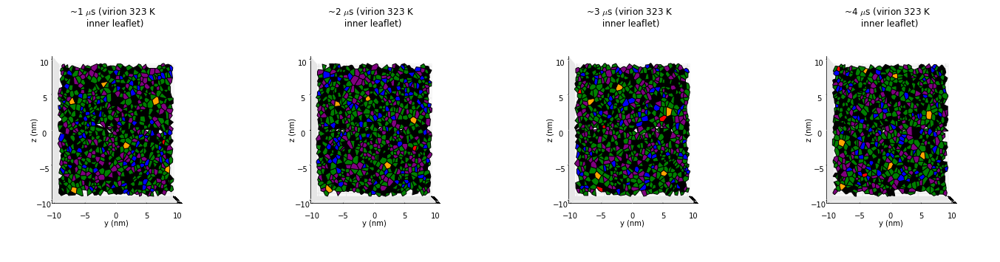

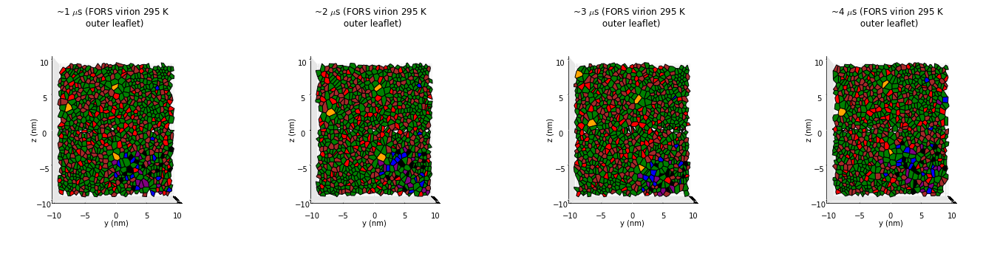

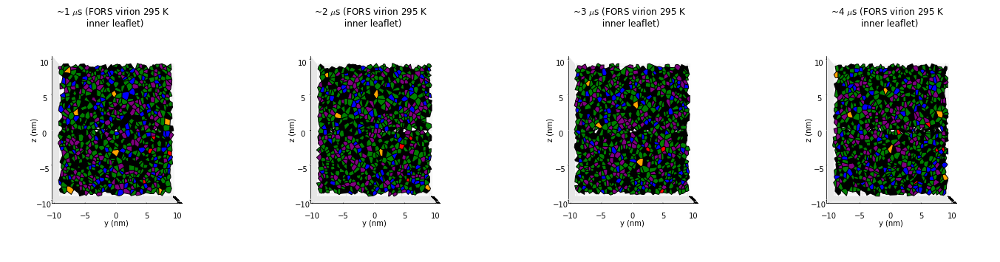

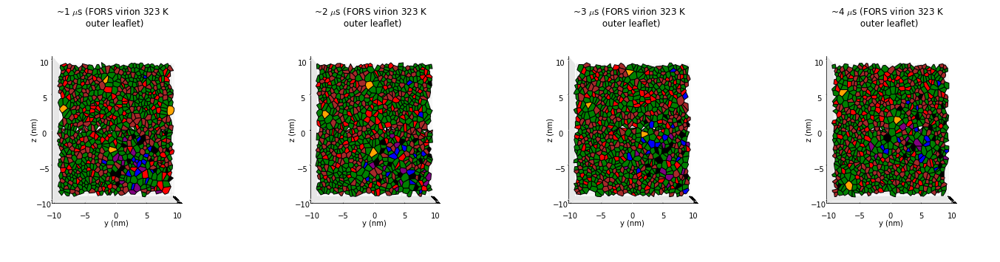

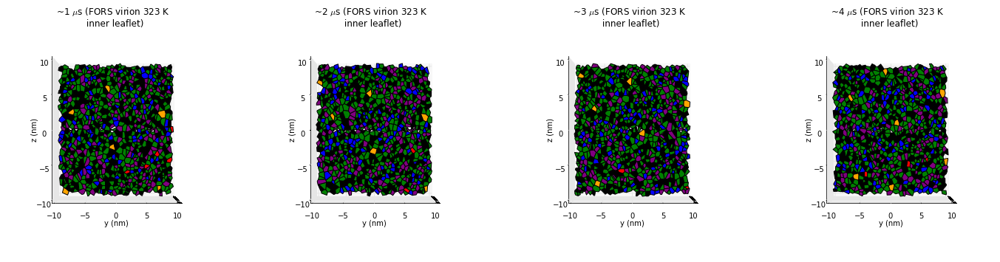

In [109]:
#plot matching zoom-in views of Voronoi diagrams (so Voronoi cells can be seen more clearly)
#sim33 outer leaflet:
fig7 = plt.figure()
list_voronoi_indices = [7,17,27,37] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig7,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','vesicle outer leaflet',sim33_dictionary_headgroup_data)
#sim33 inner leaflet:
fig8 = plt.figure()
list_voronoi_indices = [7,17,27,37] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig8,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','vesicle inner leaflet',sim33_dictionary_headgroup_data)
#sim35 outer leaflet:
fig9 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig9,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 295 K\n outer leaflet',sim35_dictionary_headgroup_data)
#sim35 inner leaflet:
fig10 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig10,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 295 K\n inner leaflet',sim35_dictionary_headgroup_data)

#sim36 outer leaflet:
fig_sim36_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim36_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','restrained virion 295 K\n outer leaflet',sim36_dictionary_headgroup_data)
#sim36 inner leaflet:
fig_sim36_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim36_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','restrained virion 295 K\n inner leaflet',sim36_dictionary_headgroup_data)

#sim37 outer leaflet:
fig_sim37_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim37_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)
#sim37 inner leaflet:
fig_sim37_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim37_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

#sim38 outer leaflet:
fig_sim38_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim38_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 295 K\n outer leaflet',sim38_dictionary_headgroup_data)
#sim38 inner leaflet:
fig_sim38_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim38_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 295 K\n inner leaflet',sim38_dictionary_headgroup_data)

#sim39 outer leaflet:
fig_sim39_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim39_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 323 K\n outer leaflet',sim39_dictionary_headgroup_data)
#sim39 inner leaflet:
fig_sim39_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_sim39_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 323 K\n inner leaflet',sim39_dictionary_headgroup_data)

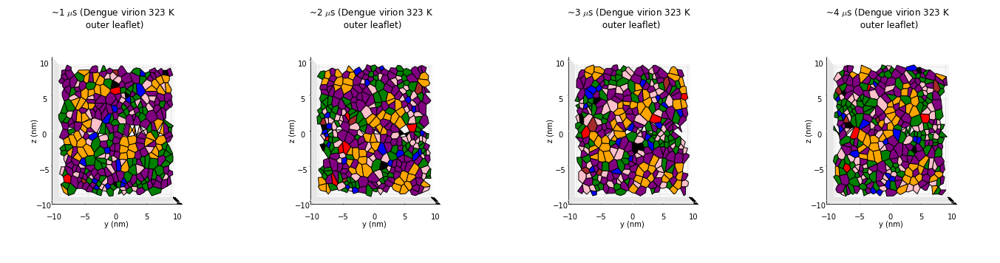

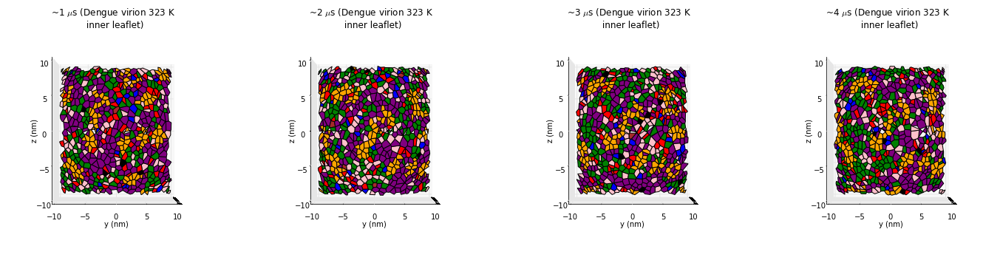

In [168]:
#test zoom plots for dengue condition:

#dengue outer leaflet:
fig_dengue_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_dengue_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue virion 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

#dengue inner leaflet:
fig_dengue_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_dengue_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue virion 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)


In [116]:
#want to pull out control condition generators for Voronoi 'blank space' debugging below
ar_generators_control_1 = engine_control_1.execute("generator_coords_control_1 = universe_object.selectAtoms('all').coordinates()")
ar_generators_control_2 = engine_control_2.execute("generator_coords_control_2 = universe_object.selectAtoms('all').coordinates()")

In [117]:
(ar_generators_control_1.ready(),ar_generators_control_2.ready())

(True, True)

In [118]:
ar_generators_control_1.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [119]:
ar_generators_control_2.get()

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

TypeError: argument of type 'NoneType' is not iterable

In [120]:
control_1_generators = engine_control_1['generator_coords_control_1']
control_2_generators = engine_control_2['generator_coords_control_2']
(control_1_generators.shape,control_2_generators.shape)

((42912, 3), (21454, 3))

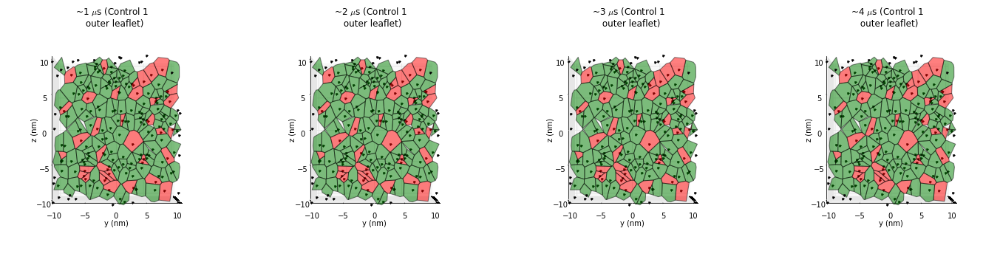

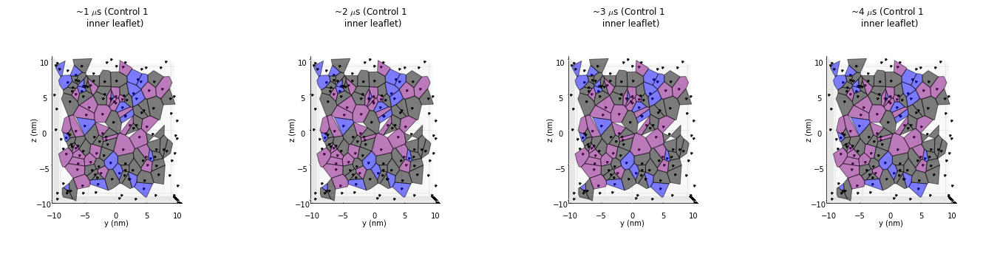

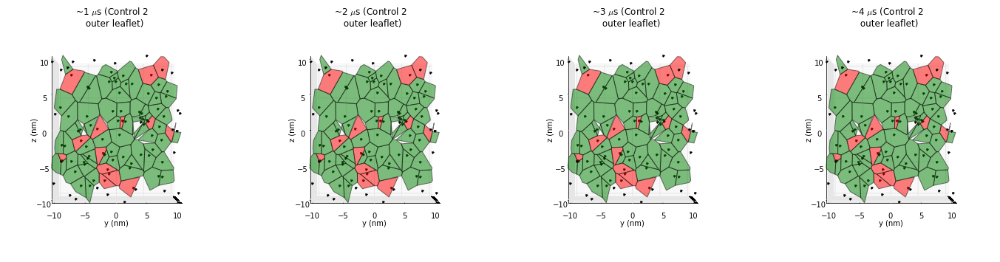

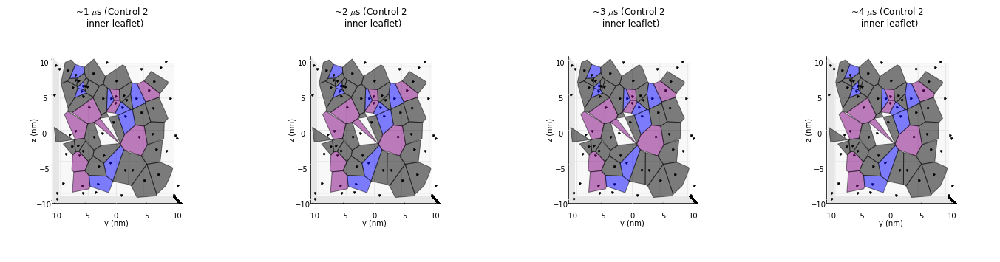

In [167]:
#test zoom plots for control conditions:
#debug blank spaces by plotting generators for these control zoom-in plots

fig_control_1_outer_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_1_outer_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 1 \n outer leaflet',control_1_dictionary_headgroup_data,None,1,control_1_generators)

fig_control_1_inner_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_1_inner_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 1 \n inner leaflet',control_1_dictionary_headgroup_data,None,1,control_1_generators)

fig_control_2_outer_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_2_outer_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 2 \n outer leaflet',control_2_dictionary_headgroup_data,None,1,control_2_generators)

fig_control_2_inner_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams_zoom(fig_control_2_inner_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 2 \n inner leaflet',control_2_dictionary_headgroup_data,None,1,control_2_generators)


In [62]:
#rough work to produce figure files for GRC 2015 poster
fig3.savefig('sim33_spherical_Voronoi_diagram_outer_leaflet.png',dpi=300)
fig4.savefig('sim33_spherical_Voronoi_diagram_inner_leaflet.png',dpi=300)
fig5.savefig('sim35_spherical_Voronoi_diagram_outer_leaflet.png',dpi=300)
fig6.savefig('sim35_spherical_Voronoi_diagram_inner_leaflet.png',dpi=300)
fig7.savefig('sim33_spherical_Voronoi_diagram_outer_leaflet_zoom.png',dpi=300)
fig8.savefig('sim33_spherical_Voronoi_diagram_inner_leaflet_zoom.png',dpi=300)
fig9.savefig('sim35_spherical_Voronoi_diagram_outer_leaflet_zoom.png',dpi=300)
fig10.savefig('sim35_spherical_Voronoi_diagram_inner_leaflet_zoom.png',dpi=300)


In [69]:
fig2.savefig('sim33_area_per_molecule_tracking.png',dpi=300)


In [81]:
fig_sim35_preliminary.savefig('sim35_area_per_molecule_tracking.png',dpi=300)


In [355]:
#rough work with dengue rhombic dodecahedron PBC problems:
ar_dengue = engine_dengue.execute("dimensions = universe_object.dimensions")

In [407]:
a,b,c,alpha,beta,gamma = engine_dengue['dimensions']

In [607]:
ar_dengue = engine_dengue.execute("all_coords = universe_object.selectAtoms('all').coordinates()")



In [610]:
ar_dengue.ready()

True

In [611]:
all_dengue_coords = engine_dengue['all_coords']

In [432]:
orthogonalization_matrix = voronoi_analysis_library.produce_orthogonalization_matrix(a,b,c,alpha,beta,gamma)

In [506]:
#use the orthogonalization matrix to transform fractional coordinates of unit cell to orthorhombic (Cartesian) coordinates of edges, so I can plot unit cell
origin = numpy.zeros(3)
end_edge_a =  numpy.dot(orthogonalization_matrix,numpy.array([1,0,0]).reshape(3,)).T
end_edge_b = numpy.dot(orthogonalization_matrix,numpy.array([0,1,0]).reshape(3,)).T
end_edge_c = numpy.dot(orthogonalization_matrix,numpy.array([0,0,1]).reshape(3,)).T
edge_a = numpy.vstack((origin,end_edge_a))
edge_b = numpy.vstack((origin,end_edge_b))
edge_c = numpy.vstack((origin,end_edge_c))
edge_opposite_a_bottom = numpy.vstack((end_edge_b,numpy.array([end_edge_a[0],end_edge_b[1],end_edge_b[2]])))
edge_opposite_b_bottom = numpy.vstack((end_edge_a,numpy.array([end_edge_a[0],end_edge_b[1],end_edge_b[2]])))
edge_opposite_c_along_a = numpy.vstack((end_edge_a,numpy.dot(orthogonalization_matrix,numpy.array([1,0,1]).reshape(3,)).T))
edge_opposite_c_along_b = numpy.vstack((end_edge_b,numpy.dot(orthogonalization_matrix,numpy.array([0,1,1]).reshape(3,)).T))
edge_diagonally_opposite_c = numpy.vstack((numpy.dot(orthogonalization_matrix,numpy.array([1,1,0]).reshape(3,)).T,numpy.dot(orthogonalization_matrix,numpy.array([1,1,1]).reshape(3,)).T))
edge_on_top_of_b = numpy.vstack((numpy.dot(orthogonalization_matrix,numpy.array([0,0,1]).reshape(3,)).T,numpy.dot(orthogonalization_matrix,numpy.array([0,1,1]).reshape(3,)).T))
edge_on_top_of_a = numpy.vstack((numpy.dot(orthogonalization_matrix,numpy.array([0,0,1]).reshape(3,)).T,numpy.dot(orthogonalization_matrix,numpy.array([1,0,1]).reshape(3,)).T))
edge_across_from_on_top_of_a = numpy.vstack((numpy.dot(orthogonalization_matrix,numpy.array([1,1,1]).reshape(3,)).T,numpy.dot(orthogonalization_matrix,numpy.array([0,1,1]).reshape(3,)).T))
edge_across_from_on_top_of_b = numpy.vstack((numpy.dot(orthogonalization_matrix,numpy.array([1,0,1]).reshape(3,)).T,numpy.dot(orthogonalization_matrix,numpy.array([1,1,1]).reshape(3,)).T))
#I suspect there's a more beautiful / concise method to orthogonalize the data given that we are just working with vertices at permutations of [0,1,0] etc.

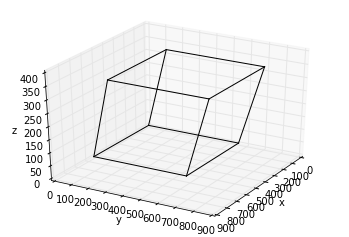

In [512]:
#rough plotting work to assess unit cell edges produced above
fig_unit_cell = plt.figure()
ax = fig_unit_cell.add_subplot('111',projection='3d')
for edge in [edge_a,edge_b,edge_c,edge_opposite_a_bottom,edge_opposite_b_bottom,edge_opposite_c_along_a,edge_opposite_c_along_b,edge_diagonally_opposite_c,edge_across_from_on_top_of_a,edge_across_from_on_top_of_b,edge_on_top_of_a,edge_on_top_of_b]:
    ax.plot(edge[...,0],edge[...,1],edge[...,2],c='k')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.azim = 30
    
    

So, I appear to have successfully constructed the primitive unit cell for a frame of the dengue simulation by using the orthogonalization matrix. Now I want to convert this to the Wigner–Seitz cell, which should be a rhombic dodecahedron. 

(14, 3)


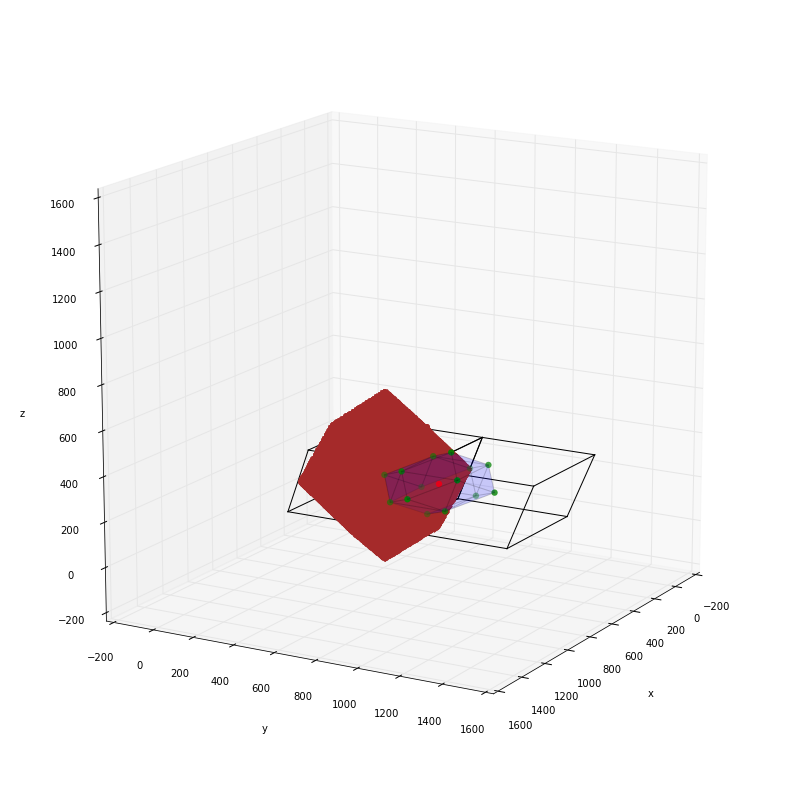

In [613]:
#expand the analysis / plotting to include an additional unit cell and the building blocks for Wigner-Seitz cell construction
fig_lattice = plt.figure()
ax = fig_lattice.add_subplot('111',projection='3d')
list_edges = [edge_a,edge_b,edge_c,edge_opposite_a_bottom,edge_opposite_b_bottom,edge_opposite_c_along_a,edge_opposite_c_along_b,edge_diagonally_opposite_c,edge_across_from_on_top_of_a,edge_across_from_on_top_of_b,edge_on_top_of_a,edge_on_top_of_b]
translated_list_edges = []
for edge in list_edges:
    ax.plot(edge[...,0],edge[...,1],edge[...,2],c='k')
    translated_edge = edge + end_edge_b
    translated_list_edges.append(translated_edge)
    ax.plot(translated_edge[...,0],translated_edge[...,1],translated_edge[...,2],c='k')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
#highlight the central lattice point for Wigner-Seitz cell construction, and the nearest neighbour lattice points
central_lattice_point = numpy.mean([end_edge_b,edge_across_from_on_top_of_b[1]],axis=0)
ax.scatter(central_lattice_point[...,0],central_lattice_point[...,1],central_lattice_point[...,2],c='red',edgecolors='None',s=40)
#nearest neighbours now (should be 12 of them)
list_nearest_neighbours_fractional_coordinates = [numpy.array(list_element) for list_element in [[0,1,0],[0,1,1],[1,1,0],[1,1,1],[1,0.5,0.5],[1,1.5,0.5],[0.5,0.5,0],[0.5,1.5,0],[0,0.5,0.5],[0,1.5,0.5],[0.5,0.5,1.0],[0.5,1.5,1.0]]]
list_nearest_neighbours_cartesian_coordinates = []
for nearest_neighbour_fractional_coord in list_nearest_neighbours_fractional_coordinates:
    nearest_neighbour_cartesian_coord = numpy.dot(orthogonalization_matrix,nearest_neighbour_fractional_coord.reshape(3,)).T
    list_nearest_neighbours_cartesian_coordinates.append(nearest_neighbour_cartesian_coord)
    #ax.scatter(nearest_neighbour_cartesian_coord[...,0],nearest_neighbour_cartesian_coord[...,1],nearest_neighbour_cartesian_coord[...,2],c='blue',edgecolors='None',s=40)
#draw lines connecting the central lattice point with its 12 NNs:
for nearest_neighbour in list_nearest_neighbours_cartesian_coordinates:
    line_coords = numpy.vstack((central_lattice_point,nearest_neighbour))
    #ax.plot(line_coords[...,0],line_coords[...,1],line_coords[...,2],c='green')
#the Voronoi region of the 13 3D points should be the Wigner-Seitz dodecahedron
import scipy.spatial
list_input_coords = list_nearest_neighbours_cartesian_coordinates[::]
list_input_coords.append(central_lattice_point)
input_coords = numpy.array(list_input_coords)
#the 3D voronoi tesselation of those input coords doesn't seem to produce what I want
#drawing the perpendicular planes at the midpoints of the lines seems tedious (but my attempts at using 3D Voronoi or convex hulls on this small set of points were not successful)
list_midpoint_coords = []
for nearest_neighbour_cartesian_coord in list_nearest_neighbours_cartesian_coordinates:
    midpoint_coord = numpy.mean([central_lattice_point,nearest_neighbour_cartesian_coord],axis=0)
    list_midpoint_coords.append(midpoint_coord)
array_midpoint_coords = numpy.array(list_midpoint_coords)
#ax.scatter(array_midpoint_coords[...,0],array_midpoint_coords[...,1],array_midpoint_coords[...,2],c='brown',edgecolors='None',s=40)
ax.set_zlim(-200,1600)
ax.set_xlim(-200,1600)
ax.set_ylim(-200,1600)
ax.azim = 30
ax.elev = 15
#try to manually place the vertices of the W-S dodecahedron based on diagram in section 14.3 of Basic Elements of Crystallography By Nevill Gonzalez Szwacki, Teresa Szwacka
array_WS_vertices_fractional_coordinates = numpy.array([[0.5,1.5,0.5],\
                                                        [0.5,0.5,0.5],\
                                                        [0.5,1.0,0.0],\
                                                        [0.5,1.0,1.0],\
                                                        [1.0,1.0,0.5],\
                                                        [0.0,1.0,0.5],\
                                                        [0.75,1.25,0.75],\
                                                        [0.25,1.25,0.75],\
                                                        [0.75,0.75,0.75],\
                                                        [0.25,0.75,0.75],\
                                                        [0.75,1.25,0.25],\
                                                        [0.25,1.25,0.25],\
                                                        [0.75,0.75,0.25],\
                                                        [0.25,0.75,0.25]])
list_WS_orthogonal_coords = []
for coord in array_WS_vertices_fractional_coordinates:
    ortho_coord = numpy.dot(orthogonalization_matrix,coord.reshape(3,)).T
    list_WS_orthogonal_coords.append(ortho_coord)
array_WS_coords = numpy.array(list_WS_orthogonal_coords)
ax.scatter(array_WS_coords[...,0],array_WS_coords[...,1],array_WS_coords[...,2],color='green',edgecolors='None',s=40)
print array_WS_coords.shape
#now, can I get scipy to do the work of assigning vertices to simplices in the (what I hope is a) dodecahedron by using ConvexHull? (I think it will put out triangular simplices--maybe I can build the rhombi manually from the triangles though?)
hull = scipy.spatial.ConvexHull(array_WS_coords)
indices_of_points_forming_triangular_facets = hull.simplices
array_triangle_coords = hull.points[indices_of_points_forming_triangular_facets]
#try plotting the triangular simplices to see if this looks like a rhombic dodecahedron
import matplotlib.colors as colors
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
for triangle in array_triangle_coords:
    #random_color = colors.rgb2hex(scipy.rand(3))
    random_color = 'blue'
    polygon = Poly3DCollection([triangle],alpha=0.1)
    polygon.set_color(random_color)
    polygon.set_edgecolors('black')
    ax.add_collection3d(polygon)
#plot the coords of all PO4 particles in the dengue universe as an initial comparison for placement of the W-S cell
#now testing with all dengue coords
ax.plot(all_dengue_coords[...,0],all_dengue_coords[...,1],all_dengue_coords[...,2],c='brown',linestyle='',marker='.')
fig_lattice.set_size_inches(14,14)

In [567]:
#maybe if I try to build a bigger primitive lattice I'll have enough coordinates to generate a suitable 3D Voronoi diagram from which I can extract the dodecahedron of interest
array_lattice_multiplier_coefficients = numpy.array([-3,-2,-1,2,3,4])
array_lattice_points_in_single_cell = numpy.array([[0,0,0],\
                                                   [0,0,1],\
                                                   [1,0,0],\
                                                   [1,0,1],\
                                                   [0,1,0],\
                                                   [0,1,1],\
                                                   [1,1,0],\
                                                   [1,1,1],\
                                                   [0.5,0,0.5],\
                                                   [0.5,0.5,0],\
                                                   [0.5,0.5,1],\
                                                   [0.5,1.0,0.5],\
                                                   [1.0,0.5,0.5],\
                                                   [0,0.5,0.5]])
#propagate lattice points to several adjacent cells to build a bigger lattice
list_expanded_lattice_points = []
counter = 0
coordinate_array_new_unit_cell_in_lattice = numpy.zeros((14,3))
for coefficient in array_lattice_multiplier_coefficients:
    coordinate_array_new_unit_cell_in_lattice[...,0] = coefficient * array_lattice_points_in_single_cell[...,0]
    coordinate_array_new_unit_cell_in_lattice[...,1:] = array_lattice_points_in_single_cell[...,1:]
    if counter == 0:
        lattice_array = numpy.concatenate((array_lattice_points_in_single_cell,coordinate_array_new_unit_cell_in_lattice))
    else:
        lattice_array = numpy.concatenate((lattice_array,coordinate_array_new_unit_cell_in_lattice))
    counter += 1
#repeat for other two dimensions
for coefficient in array_lattice_multiplier_coefficients:
    coordinate_array_new_unit_cell_in_lattice[...,1] = coefficient * array_lattice_points_in_single_cell[...,1]
    coordinate_array_new_unit_cell_in_lattice[...,0] = array_lattice_points_in_single_cell[...,0]
    coordinate_array_new_unit_cell_in_lattice[...,2] = array_lattice_points_in_single_cell[...,2]
    lattice_array = numpy.concatenate((lattice_array,coordinate_array_new_unit_cell_in_lattice))
for coefficient in array_lattice_multiplier_coefficients:
    coordinate_array_new_unit_cell_in_lattice[...,2] = coefficient * array_lattice_points_in_single_cell[...,2]
    coordinate_array_new_unit_cell_in_lattice[...,1] = array_lattice_points_in_single_cell[...,1]
    coordinate_array_new_unit_cell_in_lattice[...,0] = array_lattice_points_in_single_cell[...,0]
    lattice_array = numpy.concatenate((lattice_array,coordinate_array_new_unit_cell_in_lattice))
    
list_orthogonalized_lattice_coords = []
for lattice_coord in lattice_array:
    orthogonalized_lattice_coord = numpy.dot(orthogonalization_matrix,lattice_coord.reshape(3,)).T
    list_orthogonalized_lattice_coords.append(orthogonalized_lattice_coord)
lattice_array = numpy.array(list_orthogonalized_lattice_coords)
lattice_array.shape

    

(266, 3)

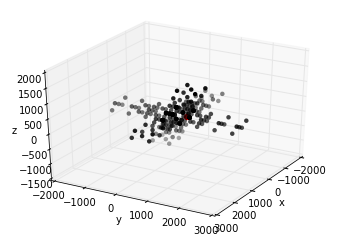

In [569]:
#test plot new primitive lattice array
fig_lattice = plt.figure()
ax = fig_lattice.add_subplot('111',projection='3d')
ax.scatter(lattice_array[...,0],lattice_array[...,1],lattice_array[...,2],c='k',edgecolors='None')
ax.scatter(central_lattice_point[...,0],central_lattice_point[...,1],central_lattice_point[...,2],c='red',edgecolors='None',s=40)
ax.azim = 30
ax.elev = 30
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

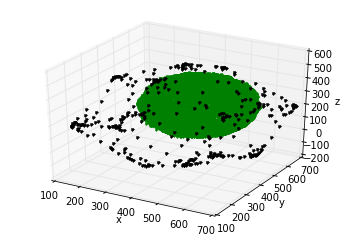

In [626]:
#more rough work with dengue / PBC issues
fig_dengue_rough = plt.figure()
ax = fig_dengue_rough.add_subplot('111',projection='3d')
#now testing with all dengue coords
#ax.plot(all_dengue_coords[...,0],all_dengue_coords[...,1],all_dengue_coords[...,2],c='brown',linestyle='',marker='.')
ax.plot(PO4_coords[...,0],PO4_coords[...,1],PO4_coords[...,2],c='green',linestyle='',marker='.')
#let's see if I can extract the 14 vertices of the W-S cell / dodecahedron by calculating the convex hull of all dengue particles (I was initially hesitant to go this route because of computational cost and skepticism that it would work)
hull = scipy.spatial.ConvexHull(all_dengue_coords)
point_indices_of_convex_hull_vertices = hull.vertices
coordinate_array_convex_hull_vertices = hull.points[point_indices_of_convex_hull_vertices]
ax.plot(coordinate_array_convex_hull_vertices[...,0],coordinate_array_convex_hull_vertices[...,1],coordinate_array_convex_hull_vertices[...,2],c='k',linestyle='',marker='.')
coordinate_array_convex_hull_vertices.shape #far more than 14 vertices, probably because of minor 'surface bumps' (this is why I didn't try this approach initially)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')



In [825]:
#rough work to calculate appropriate dengue lipid headgroup leaflet projection radii:
#just going to use average of min/max values over the course of the full trajectory
array_min_values_dengue = numpy.array(list_min_dengue_lipid_headgroup_distances)
array_max_values_dengue = numpy.array(list_max_dengue_lipid_headgroup_distances)
inner_leaflet_projection_radius_dengue = numpy.average(array_min_values_dengue)
outer_leaflet_projection_radius_dengue = numpy.average(array_max_values_dengue)
print 'inner leaflet projection radius:', inner_leaflet_projection_radius_dengue
print 'outer leaflet projection radius:', outer_leaflet_projection_radius_dengue


inner leaflet projection radius: 145.714627812
outer leaflet projection radius: 214.631666324


In [17]:
#rough work:
l1 = len(sim35_dictionary_headgroup_data['CHOL']['voronoi_cell_list_vertex_arrays'])
l1b = len(sim35_dictionary_headgroup_data['CHOL']['voronoi_cell_list_vertex_arrays_inner_leaflet'])
l2 = len(control_1_dictionary_headgroup_data['CHOL']['voronoi_cell_list_vertex_arrays'])
l2b = len(control_1_dictionary_headgroup_data['CHOL']['voronoi_cell_list_vertex_arrays_inner_leaflet'])
l1,l1b,l2,l2b

(50, 50, 50, 50)

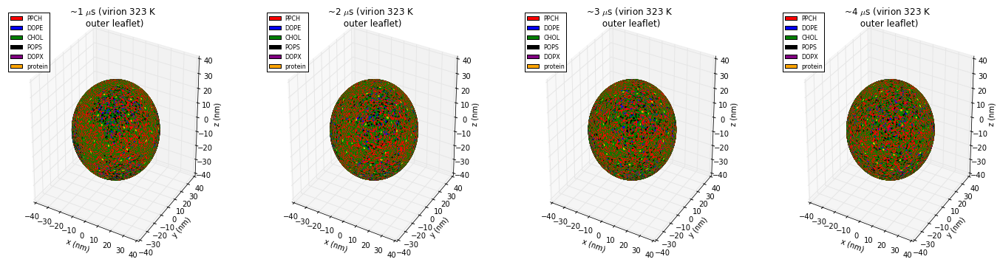

In [45]:
#rough work to generate figures appropriate for upcoming SysL presentation:

#sim37 outer leaflet
fig_sim37_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim37_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)


In [46]:
fig_sim37_outer_leaflet.savefig('flu_323K_voronoi_sample.png',dpi=300)

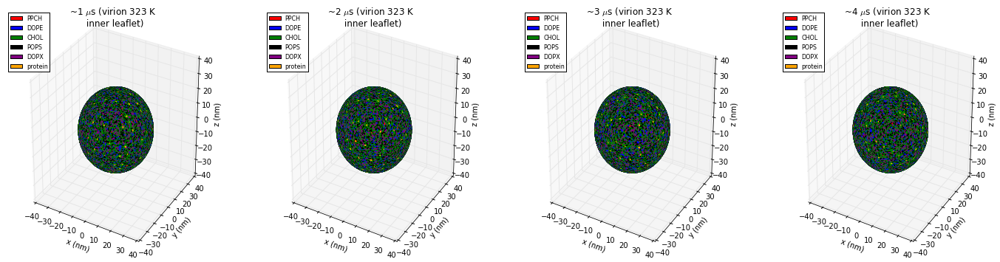

In [48]:
#sim37 inner leaflet
fig_sim37_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_sim37_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

In [49]:
fig_sim37_inner_leaflet.savefig('flu_323K_voronoi_sample_inner.png',dpi=300)

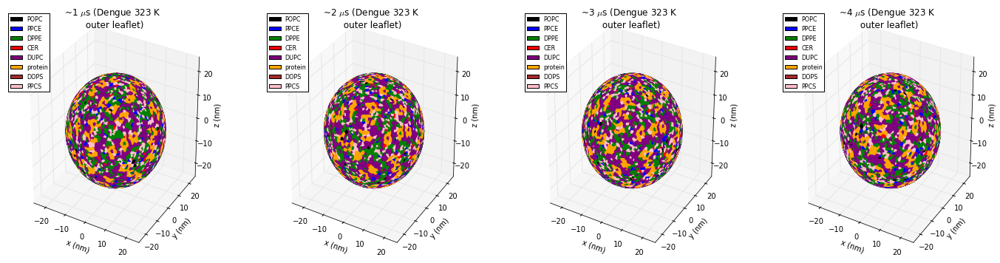

In [50]:
fig_dengue_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_dengue_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)


In [51]:
fig_dengue_outer_leaflet.savefig('dengue_323K_voronoi_sample.png',dpi=300)

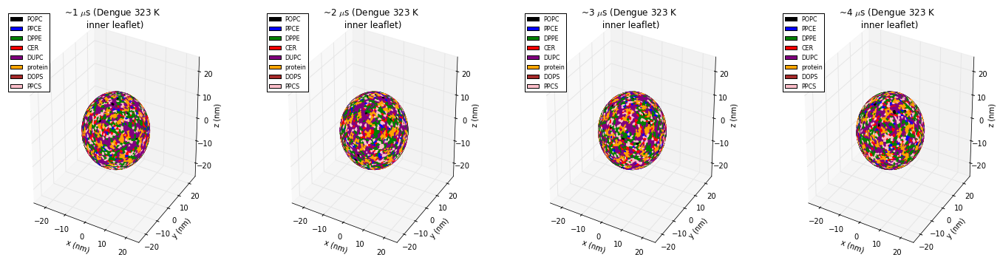

In [52]:
fig_dengue_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_analysis_library.plot_sample_Voronoi_diagrams(fig_dengue_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

In [53]:
fig_dengue_inner_leaflet.savefig('dengue_323K_voronoi_sample_inner.png',dpi=300)

In [55]:
fig_sim37_zoom_outer.savefig('flu_323K_voronoi_zoom_outer.png',dpi=300)

In [56]:
fig_sim37_zoom_inner.savefig('flu_323K_voronoi_zoom_inner.png',dpi=300)


In [58]:
fig_dengue_zoom_outer.savefig('dengue_323K_voronoi_zoom_outer.png',dpi=300)
fig_dengue_zoom_inner.savefig('dengue_323K_voronoi_zoom_inner.png',dpi=300)

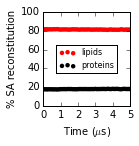

In [76]:
#customizing area per molecule plots for SysL slide

#voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig10,list_frame_numbers=dengue_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Dengue virion 323 K',dictionary_headgroup_data=dengue_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=dengue_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=dengue_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_condition=1)

fig_dengue_reconstitution_outer = plt.figure()
ax = fig_dengue_reconstitution_outer.add_subplot('111')
ax.scatter(numpy.array(dengue_list_frame_numbers_stage_2)/1000.,dengue_list_percent_surface_area_reconstitution_from_lipids_only,label='lipids',c='red',edgecolors='None')
ax.scatter(numpy.array(dengue_list_frame_numbers_stage_2)/1000.,dengue_list_percent_surface_area_reconstitution_from_proteins_only,label='proteins',c='k',edgecolors='None')
ax.legend(loc=10,fontsize=8)
ax.set_ylim(0,100)
ax.set_xlim(0,5)
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('% SA reconstitution')
fig_dengue_reconstitution_outer.set_size_inches(2,2)
fig_dengue_reconstitution_outer.subplots_adjust(left=0.3,bottom=0.25)
fig_dengue_reconstitution_outer.savefig('dengue_reconstitution_outer.png',dpi=300)


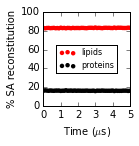

In [77]:
fig_dengue_reconstitution_inner = plt.figure()
ax = fig_dengue_reconstitution_inner.add_subplot('111')
ax.scatter(numpy.array(dengue_list_frame_numbers_stage_2)/1000.,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,label='lipids',c='red',edgecolors='None')
ax.scatter(numpy.array(dengue_list_frame_numbers_stage_2)/1000.,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,label='proteins',c='k',edgecolors='None')
ax.legend(loc=10,fontsize=8)
ax.set_ylim(0,100)
ax.set_xlim(0,5)
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('% SA reconstitution')
fig_dengue_reconstitution_inner.set_size_inches(2,2)
fig_dengue_reconstitution_inner.subplots_adjust(left=0.3,bottom=0.25)
fig_dengue_reconstitution_inner.savefig('dengue_reconstitution_inner.png',dpi=300)


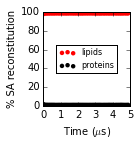

In [85]:
#plot sim37 area per molecule results:
#fig5 = plt.figure()
#voronoi_analysis_library.area_per_molecule_plotting(figure_object=fig5,list_frame_numbers=sim37_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 323 K',dictionary_headgroup_data=sim37_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim37_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim37_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
fig_flu_reconstitution_323K_outer = plt.figure()
ax = fig_flu_reconstitution_323K_outer.add_subplot('111')
ax.scatter(numpy.array(sim37_list_frame_numbers_stage_2)/10000.,sim37_list_percent_surface_area_reconstitution_from_lipids_only,label='lipids',c='red',edgecolors='none')
ax.scatter(numpy.array(sim37_list_frame_numbers_stage_2)/10000.,sim37_list_percent_surface_area_reconstitution_from_proteins_only,label='proteins',c='k',edgecolors='none')
ax.legend(loc=10,fontsize=8)
ax.set_ylim(0,100)
ax.set_xlim(0,5)
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('% SA reconstitution')
fig_flu_reconstitution_323K_outer.set_size_inches(2,2)
fig_flu_reconstitution_323K_outer.subplots_adjust(left=0.3,bottom=0.25)
fig_flu_reconstitution_323K_outer.savefig('flu_323K_reconstitution_outer.png',dpi=300)

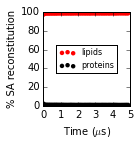

In [86]:
fig_flu_reconstitution_323K_inner = plt.figure()
ax = fig_flu_reconstitution_323K_inner.add_subplot('111')
ax.scatter(numpy.array(sim37_list_frame_numbers_stage_2)/10000.,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,label='lipids',c='red',edgecolors='none')
ax.scatter(numpy.array(sim37_list_frame_numbers_stage_2)/10000.,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,label='proteins',c='k',edgecolors='none')
ax.legend(loc=10,fontsize=8)
ax.set_ylim(0,100)
ax.set_xlim(0,5)
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('% SA reconstitution')
fig_flu_reconstitution_323K_inner.set_size_inches(2,2)
fig_flu_reconstitution_323K_inner.subplots_adjust(left=0.3,bottom=0.25)
fig_flu_reconstitution_323K_inner.savefig('flu_323K_reconstitution_inner.png',dpi=300)


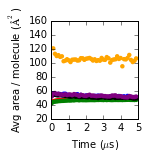

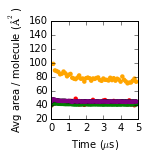

In [100]:
fig_flu_outer_area_per_molecule = plt.figure()
fig_flu_inner_area_per_molecule = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting_sysL_figures(figure_object_1=fig_flu_outer_area_per_molecule,figure_object_2=fig_flu_inner_area_per_molecule,figure_name_1='sim37_outer',figure_name_2='sim37_inner',list_frame_numbers=sim37_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 323 K',dictionary_headgroup_data=sim37_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim37_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim37_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)


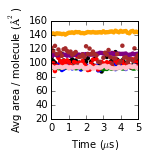

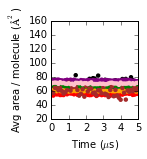

In [101]:
fig_dengue_outer_area_per_molecule = plt.figure()
fig_dengue_inner_area_per_molecule = plt.figure()
voronoi_analysis_library.area_per_molecule_plotting_sysL_figures(figure_object_1=fig_dengue_outer_area_per_molecule,figure_object_2=fig_dengue_inner_area_per_molecule,figure_name_1='dengue_outer',figure_name_2='dengue_inner',list_frame_numbers=dengue_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Dengue virion 323 K',dictionary_headgroup_data=dengue_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=dengue_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=dengue_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_condition=1)


In [135]:
control_1_dictionary_headgroup_data['POPS'].keys()

['voronoi_cell_std_values_list_inner_leaflet',
 'voronoi_cell_list_vertex_arrays_inner_leaflet',
 'voronoi_cell_avg_values_list_inner_leaflet',
 'voronoi_cell_std_values_list',
 'end_index',
 'voronoi_cell_avg_values_list',
 'voronoi_cell_list_vertex_arrays',
 'inner_leaflet_start_index',
 'inner_leaflet_end_index',
 'start_index']